In [1]:
import requests
import random
import numpy as np
import pandas as pd
import scipy.optimize as scipyo
import matplotlib.pyplot as plt
import scipy.optimize as optimize
from scipy.signal import find_peaks
from scipy.interpolate import interp1d
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
import matplotlib.colors as mcolors
from matplotlib import cm
from itertools import combinations
from itertools import permutations
from  matplotlib.colors import LogNorm
import time
import os
from scipy.ndimage import gaussian_filter
from scipy.ndimage import median_filter
import scipy.signal as scipy
from scipy.stats import multivariate_normal
from matplotlib.ticker import MaxNLocator
from collections import defaultdict





# This cell imports libraries, displays a piece of real spectrum data, and defines plotting functions.


github_url = "https://raw.githubusercontent.com/JPittard10/Isomer-Project/refs/heads/main/Trimmed%20and%20Bunched%20Spectrums/A1_Cl37_c10_HPGe_301sec_trimmed.txt"

response = requests.get(github_url)

data1 = response.text
data1_array = np.array(list(map(int, data1.split())))
bin_array = list(range(1,(len(data1_array)+1)))

Energy_bin = 0.64844 + 0.27383 * np.array((np.array(bin_array)) - 12.5)

prominence = 1e2
bin_factor = 1


# Name: Sir_Peaks_plotalot
# Purpose : plots a line on the spectrum plot where the peak was identified
# Creator : James Pittard - 29 / FEB / 2025
# Function : sir_peaks_printsalot( the array for where peaks want to be identified, name of the plot where the peak lines will be displayed i.e plot1 )



def sir_peaks_plotalot(plot_array, plot_name):
    plot_peaks, _ = scipy.find_peaks(plot_array, prominence = 1e2)
    plot_peaks_energy = (0.64844 + 0.27383 * np.array((plot_peaks) - 12.5))+6
    for peak in plot_peaks_energy:
        plot_name.axvline(x = peak, color = 'red', alpha = 0.3)
    return(plot_peaks)


# Name: Sir_Peaks_displayalot
# Purpose : displays the energy of the peaks and their respective counts from greatest to largest count, and prints all of the peaks
#           in order from the left to right side of the array
# Creator : James Pittard - 29 / FEB / 2025
# Function : sir_peaks_displayalot( the array for where peaks want to be identified, the name of the array must start with a " ' " and end with a " ' " )

def sir_peaks_displayalot(plot_array, plot_name):
    plot_peaks, _ = scipy.find_peaks(plot_array, prominence = 1e2)
    plot_peaks_energy = (0.64844 + 0.27383 * np.array((plot_peaks) - 12.5))+6
    peak_counts = plot_array[plot_peaks]
    sorted_peaks = np.argsort(peak_counts)[::-1]
    print(f"Sorted Peaks For Plot '{plot_name}'")
    print("Peak Energy (keV) | Counts")
    print("-----------------------------")
    for i in sorted_peaks:
        peak_index = plot_peaks[i]
        formatted_peak_energy = f"{plot_peaks_energy[i]:<17.3f}"
        formatted_counts = f"{plot_array[peak_index]:<10.0f}"
        print(f"{formatted_peak_energy} | {formatted_counts}")
    print("-----------------------------")
    print(f"Peaks For Plot '{plot_name}'")
    print("Peak Energy (keV)")
    for energy in plot_peaks_energy:
        print(f"{energy:<0.3f}")
    print("-----------------------------\n\n")

# Name: Plot_func
# Purpose: displays spectrum data plainly without labeling peaks
# Creator: James Pittard
# Function: plot_func(x-axis of data, y-axis of data, name of x-axis, name of y-axis, name of graph, x-axis units, y-axis units, color)

def plot_func(x_axis_data, y_axis_data, x_axis_name, y_axis_name, title_name, x_axis_unit, y_axis_unit, color_type):
    spec_plot = pd.DataFrame({x_axis_name: x_axis_data, y_axis_name: y_axis_data})
    plot = spec_plot.plot(x = x_axis_name, y = y_axis_name, title = title_name,
                          xlabel = x_axis_unit, ylabel = y_axis_unit, color = color_type, figsize = (12,6))

    return(plot)
    
# Name: Plot_peaks_func
# Purpose: displays spectrum data and identifies and labels peaks on the data
# Creator: Mason Levere
# Function: plot_peaks_func(x-axis of data, y-axis of data, name of x-axis, name of y-axis, name of graph, x-axis units, y-axis units, color (default of blue))
    
def plot_peaks_func(x_axis_data, y_axis_data, x_axis_name, y_axis_name, title_name,
                    x_axis_unit, y_axis_unit, color_type='blue', prominence=prominence):
    # detect peaks (prominence at 1e2, should be changed)
    plot_peaks, _ = scipy.find_peaks(y_axis_data, prominence=prominence)
    peak_energies = x_axis_data[plot_peaks]
    peak_counts = y_axis_data[plot_peaks]
    sorted_peaks = np.argsort(peak_counts)[::-1]

    # create df and plot
    spec_plot = pd.DataFrame({x_axis_name: x_axis_data, y_axis_name: y_axis_data})
    ax = spec_plot.plot(x=x_axis_name, y=y_axis_name, title=title_name,
                        xlabel=x_axis_unit, ylabel=y_axis_unit, color=color_type, figsize=(12, 6))


    # label peaks
    peak_list = []
    for i in sorted_peaks:
        x = peak_energies[i]
        peak_list.append(x)
        y = peak_counts[i]
        ax.plot(x, y, 'ro')  # red circle marker
        ax.text(x, y, f"{x:.1f} keV\n{int(y)}", fontsize=8, ha='center', va='bottom', rotation=0)

    peak_list = np.sort(np.round(peak_list, 1))
        

    plt.tight_layout()
    return peak_list

# Name: get_nice_colors
# Purpose: generates "n" random colors 
# Creator: Mason Levere
# Function: get_nice_colors(number of colors, color map pool)

def get_nice_colors(n, cmap_name='tab10'):
    cmap = plt.cm.get_cmap(cmap_name)
    return [cmap(i % cmap.N) for i in range(n)]

# Name: get_random_named_color
# Purpose: chooes a random color from CSS4 pool
# Creator: Mason Levere
# Function: get_random_named_color()

def get_random_named_color():
    return random.choice(list(mcolors.CSS4_COLORS.keys()))


# Name: Plot_func_ladders
# Purpose: plots ladder arrays in different colors for readability
# Creator: Mason Levere
# Function plot_func_ladders(x-range, list of ladder arrays, x-axis name, y-axis name, plot name, x-axis units, y-axis units, color pool)

def plot_func_ladders(x_axis_data, y_axis_data, x_axis_name, y_axis_name, title_name, x_axis_unit, y_axis_unit, color_type):

    # create df with one column for each y dataset
    data = {x_axis_name: x_axis_data}
    for i, y in enumerate(y_axis_data):
        data[f"{y_axis_name}_{i+1}"] = y
    spec_plot = pd.DataFrame(data)

    # generate color list
    colors = get_nice_colors(len(y_axis_data))

    # plot all y-columns 
    y_columns = [f"{y_axis_name}_{i+1}" for i in range(len(y_axis_data))]
    spec_plot.plot(
        x=x_axis_name,
        y=y_columns,
        title=title_name,
        xlabel=f"{x_axis_name} ({x_axis_unit})",
        ylabel=f"{y_axis_name} ({y_axis_unit})",
        color=colors,
        figsize=(12, 6)
    )

    plt.show()
    return()

###

def plot_level_bands(bands, spacing=3, line_length=0.5, label_offset=0.6, energy_offset=0.3):
    plt.figure(figsize=(spacing * len(bands), 10))  # increased vertical size
    ax = plt.gca()

    for i, band in enumerate(bands):
        x_offset = i * spacing
        nodes = band["nodes"]
        edges = band["edges"]

        for label, energy in nodes.items():
            ax.hlines(y=energy,
                      xmin=x_offset - line_length / 2,
                      xmax=x_offset + line_length / 2,
                      color='black', linewidth=2)

            # labels
            ax.text(x_offset + label_offset, energy, label,
                    verticalalignment='center', horizontalalignment='left',
                    fontsize=11, fontweight='bold')

        # transitions
        for u, v in edges:
            y_start = nodes[u]
            y_end = nodes[v]
            mid_y = (y_start + y_end) / 2
            delta_E = y_start - y_end

            ax.annotate("",
                        xy=(x_offset, y_end),
                        xytext=(x_offset, y_start),
                        arrowprops=dict(arrowstyle="->", lw=1.5))

            ax.text(x_offset - energy_offset, mid_y, f"{delta_E:.1f} keV",
                    fontsize=9, va='center', ha='right')

        # band label
        top_energy = max(nodes.values())
        ax.text(x_offset, top_energy + 100, band["name"],
                ha='center', va='bottom', fontsize=13, fontweight='bold')

    # formatting
    max_energy = max(max(b["nodes"].values()) for b in bands)
    ax.set_ylim(-50, max_energy + 200)  # more space on top
    ax.set_xlim(-1, len(bands) * spacing)
    ax.set_title("Level Scheme", fontsize=16, pad=40)  # padded title
    ax.axis('off')
    plt.show()  # removed tight_layout to avoid clipping title





#raw_spec_plot = plot_func(Energy_bin, data1_array, 'Energy', 'Counts', 'Raw Spectrum', 'Energy (keV)', 'Counts', 'blue')
#peaks_raw_spec = sir_peaks_plotalot(data1_array, raw_spec_plot)


#should plot based on FHWM
#------------ rel_height at 0.3 for background -------------#

#width, width_heights, left_ips, right_ips = scipy.peak_widths(data1_array, peaks_raw_spec, rel_height=0.3)

#print(len(bin_array), len(Energy_bin))

# 1D plot building functions


# Name: Gaussian_peak
# Purpose: creates a gaussian
# Creator: Mason Levere
# Function: gaussian_peak(x bins, amplitude, center, standard deviation)

def gaussian_peak(x, A, mu, sigma):

    return A * np.exp(-((x - mu) ** 2) / (2 * sigma ** 2))
    

# Name: Peak_inserter
# Purpose: generate y-values of gaussian peaks based off of real spectroscopy data (1D)
# Creator: Mason Levere
# Function: peak_inserter(x-axis, list of index values of peaks in x-axis, list of peak widths, y-values of spectroscopy data)

def peak_inserter(Energy_bin, peaks, width, data1_array):
    num_peaks = len(peaks)
    just_peaks = np.zeros(len(Energy_bin))
    print(peaks)
    for i in range(len(peaks)):
        peak_index = peaks[i]
        peak_height = data1_array[peak_index]
        sd = width[i]/2
        left = np.int64(np.ceil(peak_index - ((2*width[i])/0.27383)))
        right = np.int64(np.ceil(peak_index + ((2*width[i])/0.27383)))
        x_range = np.array(range(left, right))
        gaussian_part = gaussian_peak(x_range, peak_height, x_range[int((right-left)/2)], sd)
        int_indices = np.clip(np.round(x_range).astype(int), 0, len(just_peaks) - 1)
        np.add.at(just_peaks, int_indices, gaussian_part)
        
    return just_peaks

# Name: Peak_inserter_ladder
# Purpose: generates the arrays for ladders seperately and also gives the boundaries and integrals of the peaks (1D)
# Creator: Mason Levere
# Function: peak_inserter_ladder(x-range, list of lists of peaks, list of lists of peak heights, list of lists of widths)

def peak_inserter_ladder(Energy_bin, peaks, peak_height, width):
    peak_arrays = []
    boundaries = []
    integrals = []
    for j in range(len(peaks)): 
        num_peaks = len(peaks[j])
        just_peaks = np.zeros(len(Energy_bin))
        boundary = []
        integral = []
        for i in range(len(peaks[j])):
            peak_index = peaks[j][i]
            peak_height_num = peak_height[j][i]
            sd = width[j][i]/2
            left = np.int64(np.ceil(peak_index - ((width[j][i])/0.27383)))
            right = np.int64(np.ceil(peak_index + ((width[j][i])/0.27383)))
            x_range = np.array(range(left, right))

            gaussian_part = gaussian_peak(x_range, peak_height_num, x_range[int((right-left)/2)], sd)
            int_indices = np.round(x_range).astype(int)
            int_indices = np.clip(int_indices, 0, len(just_peaks) - 1)
            np.add.at(just_peaks, int_indices, gaussian_part)
            
            total_counts = np.int64(np.sum(gaussian_part))
            boundary.append([left, right])
            integral.append(total_counts)
        peak_arrays.append(just_peaks)
        boundaries.append(boundary)
        integrals.append(integral)
       
    return(peak_arrays, boundaries, integrals)


# Name: add_ladders
# Purpose: takes multiple ladders in 1D and shows their sum
# Creator: Mason Levere
# Function: add_ladders(list of ladder arrays)

def add_ladders(ladders):
    matrix = np.sum(ladders, axis = 0)
    return(matrix)

# 1D and 2D ladder parameter functions

# Name: Generate_ladder
# Purpose: Creates the positions, heights, and widths for a ladder within a given range of x values. 
# If the ladder is out of bounds, it resets and tries again. By default, it will generate a ldadder based on random parameters, 
# but parameters can be passed to fix certain values.
# It also generates random values for ground decay.
# (needs some work)
# Creator: Mason Levere
# Function: generate_ladder(x boundaries, fixed width for each peak, accuracy of detector, number of rungs in ladder, 
# inital x. initial y, distance between rungs)

def generate_ladder(Energy_bin, width, ground, accuracy, rungs=None, x0=None, y0=None, d0=None, size=4096):
    if rungs == None:
        rungs = np.random.randint(3, 5)
    if x0 == None:
        x0 = np.random.randint(30, (size-30))
    if y0 == None:
        y0 = np.random.randint(5000, 50000)
    if d0 == None:
        d0 = np.int64(np.random.randint(30, 600))
    
    # widths made bigger for now
    positions = [x0]
    heights = [y0]
    #widths = [np.int64(np.random.normal(np.mean(width), accuracy))*5]
    widths = [random_width(x0, bin_factor)]

    for j in range(1, rungs):
        rung_index = positions[j - 1] + np.int64(d0 * np.random.normal(1, accuracy))
        if (rung_index >= 4096) or (rung_index <= 0) : # -30 to prevent plotting on the edge
            return None  # failed ladder
        rung_height = np.int64(heights[j - 1] * np.random.uniform(0.5, 0.9))
        # width changed here too
        #rung_width = np.int64(np.random.normal(np.mean(width), accuracy)) * 5
        rung_width = random_width(rung_index, bin_factor)

        positions.append(rung_index)
        heights.append(rung_height)
        widths.append(rung_width)

    # ground transition (WIP)
    if ground:
        ground_transition_energy = np.random.randint(30, size-30)
        ground_tranisition_intensity = np.int64(2 * max(heights))
        #ground_tranisition_width = np.int64(np.random.normal(np.mean(width), accuracy))*5
        ground_tranisition_width = random_width(ground_transition_energy, bin_factor)
        positions.insert(0, ground_transition_energy)
        heights.insert(0, ground_tranisition_intensity)
        widths.insert(0, ground_tranisition_width)

    return positions, heights, widths



#### WEIRD but works


def snake_ladder(positions, heights, widths, rungs, threshold=0.2, size=4096, max_attempts=100):
    positions_lst = []
    heights_lst = []
    widths_lst = []
    i = 1
    while True:  # keeps running until failure or i==3
        # pick current tail as seed
        index = len(positions) - 1
        x0 = positions[index]
        y0 = heights[index]

        # bound-aware step
        sign = -1 if (i % 2 == 1) else 1
        left_room  = x0 - 0
        right_room = (size - 1) - x0
        room = right_room if sign > 0 else left_room
        if room < 30:
            break  # not enough space for the 30–600 rule

        # retry loop
        result = None
        for attempt in range(max_attempts):
            max_step = int(min(600, room))
            step_mag = int(np.random.randint(30, max_step + 1))
            d0 = sign * step_mag

            result = generate_ladder(Energy_bin, random_width(x0, bin_factor),
                                     0, 0.02, rungs, x0, y0, d0, size)
            if result is not None:
                break  # success

        if result is not None:
            positions, heights, widths = result
            positions_lst.extend(positions[1:])
            heights_lst.extend(heights[1:])
            widths_lst.extend(widths[1:])
            i += 1
            if i == 3:  # can only snake back twice
                break
        else:
            break  # all attempts failed

    return positions_lst, heights_lst, widths_lst




# Name: Peak_ladder
# Purpose: generates multiple ladders and outputs their parameters
# Creator: Mason Levere
# Function: peak_ladder(number of ladders, accuracy of detector, chance of a 'split' (idea of split needs work), width (default to 5 for convenience)

def peak_ladder(num_ladders, accuracy, max_rungs, threshold=0.2, width=20, size=4096):
    num_picket = 0
    num_backbends = 0    
    peak_index = []
    peak_height = []
    peak_width = []

    i = 0
    while i < num_ladders:
        result = generate_ladder(Energy_bin, width, False, accuracy, max_rungs, size=size) # ground will be set to false

        if result is not None:
            positions, heights, widths = result

            peak_index_temp = positions.copy()
            peak_height_temp = heights.copy()
            peak_width_temp = widths.copy()

            # Try to extend the band with a snake branch
            #if threshold > random.random(): # random chance to backbend
            if i == 0: #set boundary as i == 0 to force first and none others to backbend
                result2 = snake_ladder(positions, heights, widths, max_rungs, threshold=threshold, size=size)
                if result2 is not None:
                    positions_lst, heights_lst, widths_lst = result2
                    peak_index_temp.extend(positions_lst)
                    peak_height_temp.extend(heights_lst)
                    peak_width_temp.extend(widths_lst)
                    num_backbends += 1
            else:
                num_picket += 1

            # Only add results if the main ladder was successfully created
            peak_index.append(peak_index_temp)
            peak_height.append(peak_height_temp)
            peak_width.append(peak_width_temp)

            i += 1  # Only count if the core ladder is valid
        else:
            #print("generate_ladder failed, retrying...")
            x = 0

    return peak_index, peak_height, peak_width, num_picket, num_backbends


# Name: made_dict
# Purpose: make a dictionary given two lists of same dimension
# Creator: Mason Levere
# Function: make_dict(list of keys, corresponding list of values)

def make_dict(keys, values):
    return dict(zip(keys, values))

# Name: TwoDParameters
# Purpose: generates coordinates, amplitudes, and widths of peaks for a 2D matrix
# Creator: Mason Levere
# Function: TwoDParameters(list of lists of peak_indexs, list of lists for coincidences (this is taken from 
# the visual of a level scheme, counts are proportional to amplitudes due to plotting within a set sd), list of lists of peak widths)


from itertools import permutations

def TwoDParamaters(peak_index, peak_height, peak_width, pad_value=0):
    # Pad peak_width to have the same number of groups as peak_index/peak_height
    if len(peak_width) < len(peak_index):
        missing_groups = len(peak_index) - len(peak_width)
        peak_width = peak_width + [[pad_value]] * missing_groups

    # If it's longer, trim
    if len(peak_width) > len(peak_index):
        peak_width = peak_width[:len(peak_index)]

    peak_index_parameter = []
    peak_height_parameter = []
    peak_width_parameter  = []

    for i in range(len(peak_index)):
        lst_index  = peak_index[i]
        lst_height = peak_height[i]
        lst_width  = peak_width[i]

        # Pad widths inside the group if needed
        if len(lst_width) < len(lst_index):
            lst_width = lst_width + [pad_value] * (len(lst_index) - len(lst_width))

        lst_height_width = list(zip(lst_height, lst_width))
        index_height_dic = {idx: hw for idx, hw in zip(lst_index, lst_height_width)}

        coordinates = list(permutations(lst_index, 2))
        heights = [min(index_height_dic[item][0] for item in tup) for tup in coordinates]
        widths  = [tuple(index_height_dic[x][1] for x in tup) for tup in coordinates]

        peak_index_parameter.extend(coordinates)
        peak_height_parameter.extend(heights)
        peak_width_parameter.extend(widths)

    return peak_index_parameter, peak_height_parameter, peak_width_parameter


    
# 2D Functions

# Name: GateVertical
# Purpose: takes a vertical gate of a 2D matrix
# Creator: Mason Levere
# Function: GateVertical(2D matrix, center of gate, width from center of gate)

def GateVertical(matrix, energy, gate_width = 60):
    channel = EnergytoChannel(energy)
    gate_width = EnergytoChannel(gate_width)
    arrays = (matrix[:][(channel-gate_width):(channel+gate_width)])
    array = np.sum(arrays, axis=0)
    return(array)

# Name: GateHorizontal
# Purpose: takes a horizontal gate of a 2D matrix
# Creator: Mason Levere
# Function: GateHorizontal(2D matrix, center of gate, width from center of gate)

def GateHorizontal(matrix, energy, gate_width = 60):
    channel = EnergytoChannel(energy)
    gate_width = EnergytoChannel(gate_width)    
    arrays = (matrix[(channel-gate_width):(channel+gate_width)][:])
    array = np.sum(arrays, axis=0)
    return(array)
    
# Name: EnergytoChannel
# Purpose: takes an energy and converts to a channel index
# Creator: Mason Levere
# Function: EnergytoChannel(energy)

def EnergytoChannel(energy):
    channel_number = np.int64((energy-1.785)/0.99943)
    
    return(channel_number)

# Name: Gate
# Purpose: Gate on a 2D matrix given a center energy and width
# Creator: Mason Levere
# Function: Gate(2D matrix)

def Gate(matrix, bin_factor=1): 
    N_full = 4096
    while True:
        gate_input = input('Gate Energy? (return to escape)')
        if gate_input == '':
            break
        else:
            gate = int(gate_input)
        width_input = input('Width (default of 20 keV): ')
        if width_input == '':
            width = 20
        else:
            width = int(width_input)
        x1 = GateVertical(matrix, gate, width)
        N = np.shape(matrix)[0]
        energy_axis = (1.785 + (0.99943 * (np.arange(N) * bin_factor)))      
        Energy_bin = energy_axis
        plot_peaks_func(Energy_bin, x1, 'Energy', 'Counts', f'Gate at {gate}kEv from {gate-width} to {gate+width}', 'Energy (keV)', 'Counts', 'blue')
        plt.show()

# Name: TotalProjection
# Purpose: gives a 1D coincidence view of a 2D matrix by summing down on the rows
# Creator: Mason Levere
# Function: TotalProjection(2D matrix)


def TotalProjection(matrix, peak_display = 1, bin_factor=1, title='Total Projection', prominence=prominence):
    N = matrix.shape[0]
    array = np.sum(matrix, axis=0)

    # Do NOT scale center shift — keep it fixed to match calibration
    center_shift = 12.5
    energy_axis = 1.785 + (0.99943 * (np.arange(N)*bin_factor))
    
    if peak_display:
        return plot_peaks_func(energy_axis, array, 'Energy', 'Counts', title, 'Energy (keV)', 'Counts', 'blue', prominence)
    else:
        return plot_func(energy_axis, array, 'Energy', 'Counts', title, 'Energy (keV)', 'Counts', 'blue')
#need better gating width

def band_maker(gammas_lst, bin_factor = 1, flag=False):
    bands = []
    for i in range(len(gammas_lst)):
        peak_energy = gammas_lst[i]
        levels = linear_gamma_to_levels(peak_energy)
        levels[0] = 0
        node_labels = ['grnd']
        for j in range(len(levels)-1):
            node_labels.append(f'b{i+1} lvl{j+1}')
        
        nodes_dict = dict(zip(node_labels, levels))
        node_labels_reversed = node_labels[::-1]
        edge_tups = [(a, b) for a, b in zip(node_labels_reversed, node_labels_reversed[1:])]

        
        band_info = dict(name = f'Band {i+1}', nodes = nodes_dict, edges = edge_tups)
        bands.append(band_info)
    
    return(bands)

# example of formatting
#bands = [
#    {
#        "name": "Band 1",
#        "nodes": {"g": 0, "a": 100, "b": 300, "c": 600},
#        "edges": [("c", "b"), ("b", "a"), ("a", "g")]
#    },
#    {
#        "name": "Band 2",
#        "nodes": {"g": 0, "x": 150, "y": 400, "z": 700},
#        "edges": [("z", "y"), ("y", "x"), ("x", "g")]
#    }
#]


def linear_gamma_to_levels(gammas):
    levels = [0]
    for i in range(1, len(gammas)+1):
        levels.append(np.sum(gammas[0:i]))
    return(levels)




def TwoDPlot(matrix, title='2D Plot', bin_factor=1):
    N = matrix.shape[0]
    energy_axis = 1.785 + (0.99943 * (np.arange(N) * bin_factor))
    
    # Set up tick positions
    tick_start = int(np.ceil(energy_axis[0] / 500)) * 500
    tick_end = int(np.floor(energy_axis[-1] / 500)) * 500
    ticks = np.arange(tick_start, tick_end + 1, 500)

    plt.figure()
    plt.imshow(matrix, cmap='viridis', norm=LogNorm(), interpolation='nearest', origin='lower',
               extent=[energy_axis[0], energy_axis[-1], energy_axis[0], energy_axis[-1]])
    plt.colorbar(label="Intensity")
    plt.xticks(ticks)
    plt.yticks(ticks)
    plt.xlabel("Energy (keV)")
    plt.ylabel("Energy (keV)")
    plt.title(title)
    plt.show()


def random_width(x=0, bin_factor=1):
    sd_energy = 2 + (6 * x / 4096)  # scales linearly from 2 to 8
    index_sd = sd_energy / 0.99943  # 0.99943 keV/bin

    return(index_sd)


def compress_matrix(matrix, bin_factor):
    """
    Compress a square matrix by averaging blocks, then scaling up
    so the total projection (sum) is preserved and energy axis range stays consistent.
    
    Parameters:
    - matrix: 2D numpy array (e.g., 4096x4096)
    - bin_factor: int, must evenly divide the matrix dimensions

    Returns:
    - compressed_matrix: downsampled 2D numpy array
    """
    N = matrix.shape[0]
    if N % bin_factor != 0:
        raise ValueError("Matrix size must be divisible by bin_factor")

    # Block average
    compressed_matrix = matrix.reshape(
        N // bin_factor, bin_factor,
        N // bin_factor, bin_factor
    ).mean(axis=(1, 3))

    # Scale up to preserve total projection
    compressed_matrix *= bin_factor

    return compressed_matrix

def index_to_energy(index, bin_factor=bin_factor):
    return (1.785 + (0.99943 * (index * bin_factor)))
def add_poisson_noise(background, scale=1):
    noisy_background = ((np.random.poisson(lam=np.clip(background, 0, None)) - background) * scale) + background
    upper = np.triu(noisy_background)
    matrix = upper + upper.T - np.diag(np.diag(noisy_background))
    return matrix

def add_gaussian_noise(matrix, mean=0, std=1):
    mask = matrix != 0  # only apply noise to non-zero elements
    matrix = matrix.astype(np.float64) 
    noisy_matrix = matrix.copy()
    noise = np.random.normal(mean, std, size=matrix.shape)
    noisy_matrix[mask] += noise[mask]
    return noisy_matrix

def smooth_2d(matrix, sigma=1.0, truncate=4.0):
    """
    Applies 2D Gaussian smoothing to a matrix.

    Parameters:
    - matrix: 2D numpy array
    - sigma: standard deviation of the Gaussian kernel (can be float or (sx, sy))
    - truncate: kernel truncation (default 4.0 means kernel extends to 4*sigma)

    Returns:
    - Smoothed 2D matrix
    """
    return gaussian_filter(matrix, sigma=sigma, truncate=truncate)


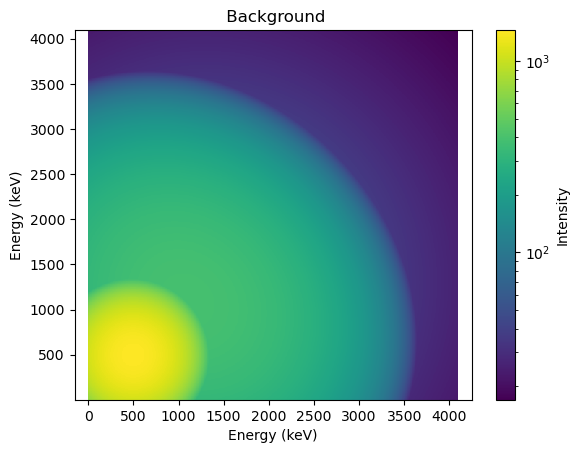

array([521.5])

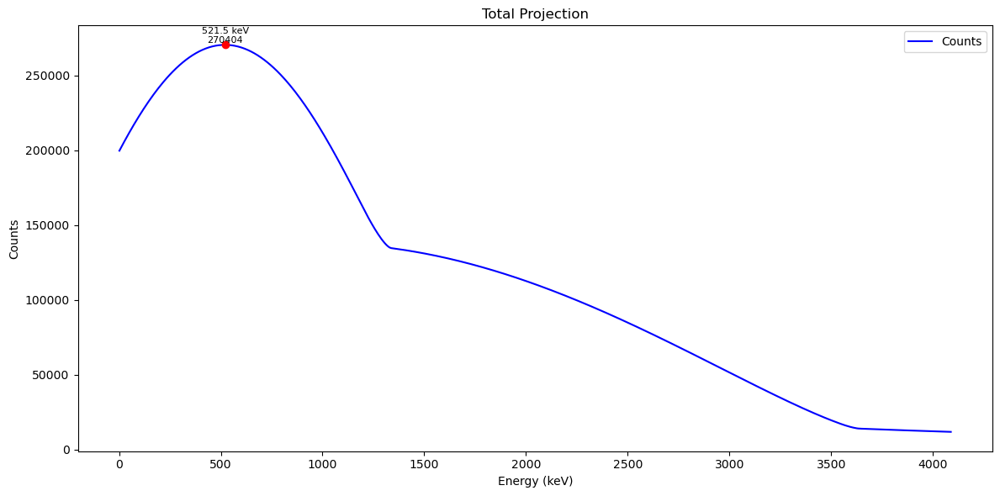

In [3]:
# this block specifies the file location of the background 2d file loaded in and displays its 2d plot and total projection

bg_file_path = 'custombg.npy'
bg = np.load(bg_file_path)
bgclipped = np.clip(bg, a_min=0, a_max=None)



np.shape(bg)


N = 4096
bin_factor = 1
energy_axis = 1.785 + (0.99943 * (np.arange(N) * bin_factor))

bin_factor = 8

bg_comp = compress_matrix(bg, bin_factor=bin_factor)




plt.figure()
plt.imshow(bg_comp, cmap='viridis', norm=LogNorm(), interpolation='nearest', origin='lower',
                   extent=[energy_axis[0], energy_axis[-1], energy_axis[0], energy_axis[-1]])
plt.colorbar(label="Intensity")
plt.title(f" Background")
plt.xlabel("Energy (keV)")
plt.ylabel("Energy (keV)")
plt.axis('equal')
plt.show()


TotalProjection(bg_comp, bin_factor=bin_factor)


In [19]:
# this cell is responsible for running 1 trial at a time and checking them
# dim controls the dimension of the matrix
# max_rungs controls the amount of states in each normal band
# num_ladders controls the amount of bands in the data

seed = 10
dim = 512
bin_factor = 4096//dim
max_rungs = 3
num_ladders = random.randint(3, 5)
num_ladders = 3
noise_factor = 3




bg_comp = compress_matrix(bg, bin_factor=bin_factor) / 10


N = 4096//bin_factor
#energy_axis = 1.785 + (0.99943 * (np.arange(N) * bin_factor))

start_time_i = time.time()

def counts_validation(ordered_transitions, transitions_dict):
    counts_lst = [transitions_dict[transition] for transition in ordered_transitions]
    return(counts_lst)

def is_non_increasing(arr):
    return all(arr[i] <= arr[i-1] for i in range(1, len(arr)))

def flag_if_any_false(bool_list):
    return any(not x for x in bool_list)

def has_duplicate(lst):
    return len(lst) != len(set(lst))


def simulate_2D_matrix(seed, max_rungs, bin_factor=1, cutoff_sigma=10, plot=True, num_ladders=1):
    rng_np = np.random.default_rng(seed)
    rng_py = random.Random(seed)
    start_time = time.perf_counter()




    def scaled_index_to_energy(index):
        return 1.785 + (0.99943 * (index * bin_factor))

    
    count_lst = []
    count_lst2 = []
    count_check = []
    full_counts_lst = []
    AG_lst = []
    ground_band_index = 1

    
    

    N_full = 4096
    N = N_full // bin_factor
    energy_axis = 1.785 + (0.99943 * (np.arange(N) * bin_factor))
    X, Y = np.meshgrid(energy_axis, energy_axis)
    matrix = np.zeros((N, N), dtype=np.float32)
    
    # number of peaks in a matrix (can be fixed)
    peak_index, peak_height, peak_width, num_picket, num_backbends = peak_ladder(num_ladders, 0.02, max_rungs, threshold=0.2) #threshold adjusts how likely backbends occur
    
    peak_index_ls = [
    [scaled_index_to_energy(i // bin_factor) for i in sublist]
    for sublist in peak_index
]
    
    new_states = [transitions_to_states(i) for i in peak_index_ls]

    energy_levels_banded = [list(zip(sub_states, sub_heights)) 
          for sub_states, sub_heights in zip(new_states, peak_height)]

    #print(new_states, 'new states')

    #print(peak_height, 'peak heigh')

    #print(energy_levels_banded, 'e levels banded')

    new_scheme = parameters_to_band(energy_levels_banded, ground_band_index)

    all_energies, all_counts = level_analyzer(new_scheme)

    #print(all_energies, 'all energies')
    
    print(all_energies, 'peak_index_parameter')
    print(all_counts, 'peak_height_parameter')
    peak_index_parameter, peak_height_parameter, peak_width_parameter = TwoDParamaters(all_energies, all_counts, peak_width)

   

    #print(num_backbends, 'backbends')
    #print(num_picket, 'picket')
    #print(peak_index_parameter, 'peak index parameter', len(peak_index_parameter))



    transitions_per_band = [len(band) for band in peak_index]
    #print(transitions_per_band, 'tran per band')

    transition_energy = [item for sublist in peak_index_ls for item in sublist]
    #print(peak_index_ls, '1')
    
    #print(transition_energy, '2')
    

   # print(transitions_per_band, 'transitions per band')
    #print(peak_index, 'peak index')

    scaled_index = [(i[0] // bin_factor, i[1] // bin_factor) for i in peak_index_parameter]
    scaled_width = peak_width_parameter

    #print(scaled_index, 'scaled_index')
    

    centers_x = [scaled_index_to_energy(t[0]) for t in scaled_index]
    centers_y = [scaled_index_to_energy(t[1]) for t in scaled_index]
    sigmas_x = [t[0] for t in scaled_width]
    sigmas_y = [t[1] for t in scaled_width]



    #print(peak_index_ls, 'yup')

    amplitudes = peak_height_parameter

    
    #print(amplitudes, 'amps')
    #print(len(centers_x), len(amplitudes), 'len check')
    #print(sigmas_x, sigmas_y)
    
    i = 0
    j = 0
    count_dict = defaultdict(float)

    for x0, y0, sx, sy, A in zip(centers_x, centers_y, sigmas_x, sigmas_y, amplitudes):
        #print(x0, y0, sx, sy, A)
        #print(x0)
        
        A *= 1
        sx = 6
        sy = 6
        #print(x0, y0, A)



        xmin = max(0, np.searchsorted(energy_axis, x0 - cutoff_sigma * sx))
        xmax = min(N, np.searchsorted(energy_axis, x0 + cutoff_sigma * sx))
        ymin = max(0, np.searchsorted(energy_axis, y0 - cutoff_sigma * sy))
        ymax = min(N, np.searchsorted(energy_axis, y0 + cutoff_sigma * sy))

        if xmax <= xmin or ymax <= ymin:
            continue
            
        mean = [x0, y0]
        cov = [[sx**2, 0], [0, sy**2]]

        
        rv = multivariate_normal(mean, cov)

        X_sub = X[ymin:ymax, xmin:xmax]
        Y_sub = Y[ymin:ymax, xmin:xmax]
        
        pos = np.dstack((X_sub, Y_sub))

        G = rv.pdf(pos)
        G = (G / np.sum(G)) * A
        #TwoDPlot(G, title='G')
        #print(np.sum(G) == A)
        #if np.sum(G) != A:
            #print(np.sum(G), 'G', A, 'A')
        AG_lst.append(np.isclose(np.sum(G), A))

        

        count_lst.append(np.sum(G))
        count_dict[x0] += np.sum(G.astype(np.float32))
        i += 1
        #print(np.sum(G), i)
        if i == (transitions_per_band[j]*(transitions_per_band[j]-1)):
            ordered_count_lst = np.round(np.array(counts_validation(peak_index_ls[j], count_dict))).astype(int)
            #print(ordered_count_lst, 'it worked')
            #print(is_non_increasing(ordered_count_lst))
            count_check.append(is_non_increasing(ordered_count_lst))
            full_counts_lst.append(ordered_count_lst)
            

            j += 1
            i = 0
            count_dict = defaultdict(float)

        

        
        matrix[ymin:ymax, xmin:xmax] += G.astype(np.float32)
        dx = np.mean(np.diff(energy_axis))
        dy = dx  # assuming square bins

# Then scale your numerical sum:


    
    flag = flag_if_any_false(count_check)
    if flag == True:
        #print(peak_index[0], 'way that peaks are ordered')
        #print(full_counts_lst[0], 'counts of those peaks')
        #print(peak_index, peak_height, 'initial parameters')
        #print(peak_index_parameter, peak_height_parameter, '2D parameters')
        print([has_duplicate(peak_index_ls[i]) for i in range(num_ladders)], 'dupe checker bands')
        print(has_duplicate(transition_energy), 'dupe checker whole')
        #print(peak_index_ls)
        
        #print(AG_lst, 'AG list')
    
    #print(flag, 'flag')
    
    #print(count_dict, 'count dictionary')

    matrix *= 3 # for scaling with bg
    matrix += 0  # Prevent log(0) in plot
    #print('amp', amplitudes)
    #print('counts', count_lst)
    #print('2', count_lst2)

    if plot:
        plt.imshow(matrix, cmap='viridis', norm=LogNorm(), interpolation='nearest', origin='lower',
                   extent=[energy_axis[0], energy_axis[-1], energy_axis[0], energy_axis[-1]])
        plt.colorbar(label="Intensity")
        plt.title("Simulated Peaks")
        
        plt.xlabel("Energy (keV)")
        plt.ylabel("Energy (keV)")
        plt.axis('equal')
        plt.show()
    #print(peak_index_ls, 'right here!')
    level_scheme = band_maker(peak_index_ls, bin_factor, flag=flag)



    return(matrix, level_scheme, transitions_per_band, transition_energy, num_picket, num_backbends, flag, full_counts_lst)





    




matrix, level_scheme, transitions_per_band, transition_energy, num_picket, num_backbends, flag, full_counts_lst = simulate_2D_matrix(seed, max_rungs, bin_factor=bin_factor, num_ladders=num_ladders, cutoff_sigma=30)
print(transitions_per_band, 'important')

print(flag, 'flag')
matrix = matrix * 1

TotalProjection(matrix, bin_factor=bin_factor)

#bgcp = np.maximum(add_poisson_noise(bgcquad, scale=4), add_poisson_noise(bgcexp, scale=4))
#bgcp = (add_poisson_noise(bg_comp, scale=10))

# Apply Gaussian smearing with std = sqrt(n)

bgcp = (bg_comp + np.random.normal(0,  noise_factor * np.sqrt(bg_comp)) ) # 3 is scale factor
bgcp = np.clip(bgcp, 0, None)


#bgcg = add_gaussian_noise(bgcp, std=20)


#bgfiltered = smooth_2d(bgcp, sigma=1.3)


matrix_bg = np.clip(add_poisson_noise(matrix + bgcp), a_min=0, a_max=None) + 1

end_time = time.time()
elapsed_time = end_time - start_time_i
print('Elapsed Time:', elapsed_time)


#TotalProjection(bgcg, 0, title = 'Gaussian + Poisson Total Projection', bin_factor=bin_factor)


plot_level_bands(level_scheme)
plt.savefig("level_scheme.jpg", format='jpg', dpi=300)  # dpi=300 for high resolution




#print(counts_validation(

plt.figure()
TwoDPlot(bgcp, 'Background with Noise', bin_factor)
plt.figure()
TotalProjection(bgcp, 0, title = 'Background with Noise', bin_factor=bin_factor)
plt.figure()
TwoDPlot(matrix_bg, 'Simulated 2D Coincidence Matrix', bin_factor)
plt.figure()
TotalProjection(matrix_bg, 0, bin_factor=bin_factor, prominence=1e4)


# histograms of band number, transitions per band, transitions total, distribution of energy (above and below half energy), number of backbends

# 4 parameters in the object 

[[551, 1361, 1881, 2113, 2344, 2057, 1769, 2201], [1881, 551, 1361, 2113, 2344, 2057, 1769, 2201], [2113, 1881, 551, 1361, 2344, 2057, 1769, 2201], [2344, 2113, 1881, 551, 1361, 2057, 1769, 2201], [2057, 2344, 2113, 1881, 551, 1361, 1769, 2201], [1769, 2057, 2344, 2113, 1881, 551, 1361, 2201], [2201, 1769, 2057, 2344, 2113, 1881, 551, 1361], [1361, 551, 1881, 2113, 2344, 2057, 1769, 2201, 209, 410, 450, 1505], [1361, 551, 1881, 2113, 2344, 2057, 1769, 2201, 209, 410, 450, 1505], [1505, 1361], [209, 1361, 410, 450], [410, 209, 1361, 450], [450, 410, 209, 1361]] peak_index_parameter
[[20608, 22976, 17831, 15899, 9065, 5784, 5088, 3749], [17831, 20608, 22976, 15899, 9065, 5784, 5088, 3749], [15899, 17831, 20608, 22976, 9065, 5784, 5088, 3749], [9065, 15899, 17831, 20608, 22976, 5784, 5088, 3749], [5784, 9065, 15899, 17831, 20608, 22976, 5088, 3749], [5088, 5784, 9065, 15899, 17831, 20608, 22976, 3749], [3749, 5088, 5784, 9065, 15899, 17831, 20608, 22976], [22976, 20608, 17831, 15899, 9065

IndexError: list index out of range

In [237]:
Gate(matrix, bin_factor=bin_factor)

Gate Energy? (return to escape) 


In [17]:
energy_levels_banded = np.array([[(0, 50), (200, 30), (700, 10)], [(1000, 50), (1100, 20), (1300, 10)]]) # format is energy level, then population


def transitions_to_states(transitions):
    levels = linear_gamma_to_levels(transitions)
    levels[0] = 0
    return(levels)

x = [23, 40, 50]

#y = transitions_to_states(x)
#print(y, 'sans undertale')

ground_band_index = random.randint(0, len(energy_levels_banded)-1)
ground_band_index = 1




# only works for case where num_ladders = 3
def total_outgoing_intensity(level):
    return sum(t.intensity for t in level.get_outgoing_transitions())

def total_incoming_intensity(level):
    # assumes your Level has get_incoming_transitions()
    return sum(t.intensity for t in level.get_incoming_transitions())

def parameters_to_band(energy_levels_banded, ground_band_index):
    scheme = LevelScheme()
    bands = []

    # 1) Build bands & levels
    for i, band_levels in enumerate(energy_levels_banded):
        band = scheme.add_band(f"Band {i+1}")
        for (energy, population) in band_levels:
            band.add_level(energy, 0, '+', population)
        bands.append(band)

    # 2) For each non-ground band: adjust energies & scale populations if needed
    for i, band in enumerate(bands):
        if i == ground_band_index:
            continue

        src_levels = band.levels
        dst_levels = bands[ground_band_index].levels

        if len(dst_levels) <= 1:
            continue  # can't feed if ground band has only one state

        # pick target ground-band state (not true ground)
        target = random.choice(dst_levels[1:])

        # ---- Energy shift: ensure lowest src > target by margin in [100, 1000] ----
        margin_min, margin_max = 100.0, 1000.0
        margin = random.uniform(margin_min, margin_max)

        min_src_energy = min(l.energy for l in src_levels)
        target_energy = target.energy
        required_floor = target_energy + margin

        if min_src_energy < required_floor:
            shift = required_floor - min_src_energy
            for lvl in src_levels:
                lvl.energy += shift

        # ---- Intensity scaling to avoid overfeeding ----
        lowest_state = src_levels[0]
        incoming_now = total_incoming_intensity(target)
        capacity = max(0.0, target.population - incoming_now)

        needed = float(lowest_state.population)
        if needed > capacity and needed > 0:
            factor = capacity / needed  # in (0,1]
            for lvl in src_levels:
                lvl.population *= factor
            needed = float(lowest_state.population)

        if needed > 0:
            scheme.add_transition(lowest_state, target, intensity=needed)

    # 3) Add in-band cascades
    for band in bands:
        levels = band.levels
        for j in range(len(levels) - 1, 0, -1):
            spill = levels[j].population - total_outgoing_intensity(levels[j])
            if spill > 0:
                scheme.add_transition(levels[j], levels[j-1], intensity=spill)

    return scheme





def level_analyzer(scheme):
    all_energies = []
    all_counts = []

    for band in scheme.bands.values():
        for level in band.levels:
            downs = down_maker(level)
            ups = up_maker(level)
            transitions = downs + ups

            energies = [int(round(t.energy_diff)) for t in transitions]
            counts = [int(round(t.intensity)) for t in transitions]

            if energies and counts:  # only add if both are non-empty
                all_energies.append(energies)
                all_counts.append(counts)

    return all_energies, all_counts
#new version, old might be better

def level_analyzer(scheme):
    all_energies = []
    all_counts = []

    for band in scheme.bands.values():
        for level in band.levels:
            downs = down_maker(level)
            ups = up_maker(level)
            transitions = downs + ups

            all_energies.append([int(round(t.energy_diff)) for t in transitions])
            all_counts.append([int(round(t.intensity)) for t in transitions])

    return all_energies, all_counts


    

            
#print(len(energy_levels_banded)-1, 'lookie')

print(parameters_to_band(energy_levels_banded, ground_band_index))


scheme = parameters_to_band(energy_levels_banded, ground_band_index)
x, y = level_analyzer(scheme)
print(x)
print(y)


        
        
        

Band Band 1 with levels: [0+ (1920.6989452936175 keV, Pop: 10.0), 0+ (2120.6989452936177 keV, Pop: 6.0), 0+ (2620.6989452936177 keV, Pop: 2.0)]
Band Band 2 with levels: [0+ (1000 keV, Pop: 50), 0+ (1100 keV, Pop: 20), 0+ (1300 keV, Pop: 10)]

Transitions:
  0+ (1920.6989452936175 keV, Pop: 10.0) → 0+ (1300 keV, Pop: 10) | ΔE = 620.7 keV, I = 10.0)
  0+ (2620.6989452936177 keV, Pop: 2.0) → 0+ (2120.6989452936177 keV, Pop: 6.0) | ΔE = 500.0 keV, I = 2.0)
  0+ (2120.6989452936177 keV, Pop: 6.0) → 0+ (1920.6989452936175 keV, Pop: 10.0) | ΔE = 200.0 keV, I = 6.0)
  0+ (1300 keV, Pop: 10) → 0+ (1100 keV, Pop: 20) | ΔE = 200.0 keV, I = 10)
  0+ (1100 keV, Pop: 20) → 0+ (1000 keV, Pop: 50) | ΔE = 100.0 keV, I = 20)

[[471, 100, 200, 500], [200, 471, 100, 500], [500, 200, 471, 100], [100, 471, 200, 500, 200], [100, 471, 200, 500, 200], [200, 100]]
[[20, 20, 12, 4], [12, 20, 20, 4], [4, 12, 20, 20], [20, 20, 12, 4, 10], [20, 20, 12, 4, 10], [10, 20]]


Elapsed Time Total: 43.05226707458496 seconds


KeyboardInterrupt: 

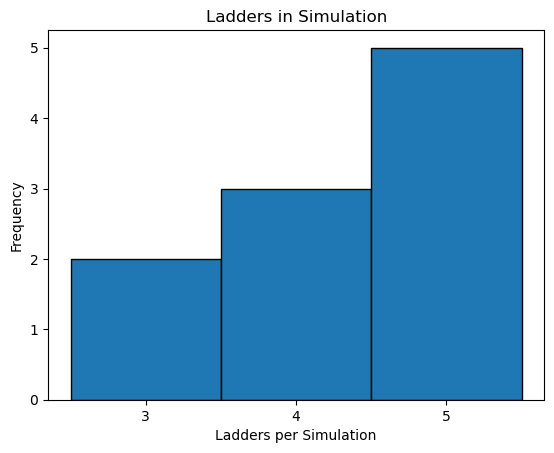

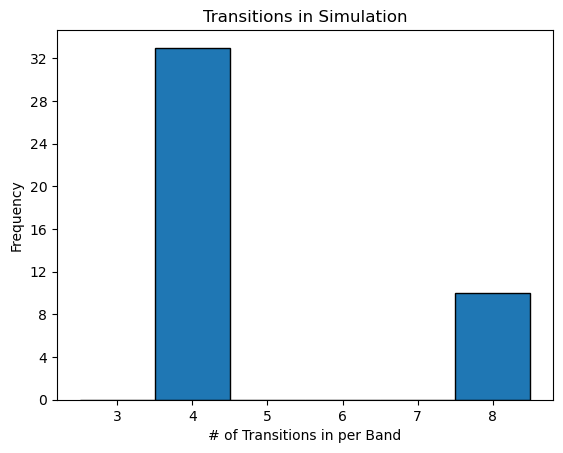

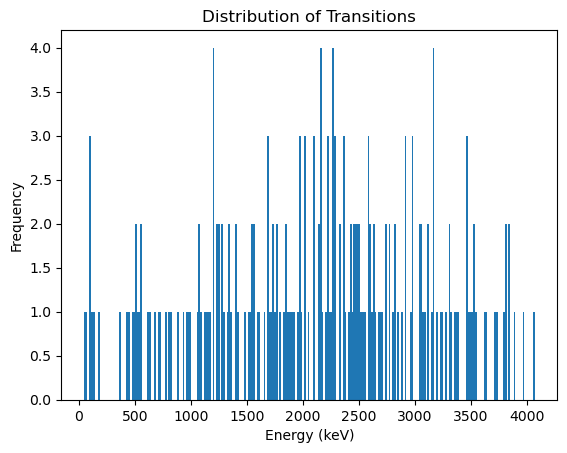

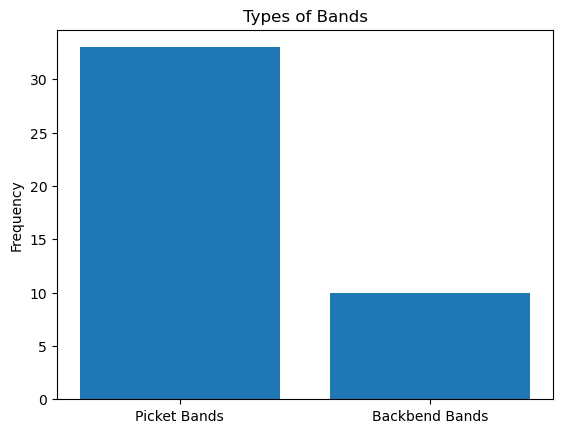

In [13]:
# this cell executes the simulation data and saves it to a .npz file
# a custom name of the file can be chosen, by default it includes the max_rungs and dim_actual parameters in the name

sims = {}
num_sims = 10
max_rungs = 3
dim_pref = 4096
bin_factor = 4096//dim_pref
dim_actual = 4096//bin_factor
noise_factor = 3

num_ladders_hist = np.array([])
transitions_per_band_hist = np.array([])
transition_energy_hist = np.array([])
num_picket_total = 0
num_backbends_total = 0
failed = []
failed_counts = []


start_time = time.time()
print(dim_actual)


bg_comp = compress_matrix(bg, bin_factor=bin_factor)



i = 0
while i < num_sims:
    start_time_i = time.time()
    
    num_ladders = random.randint(3, 5)


    (matrix, level_scheme, transitions_per_band, transition_energy,
     num_picket, num_backbends, flag, full_counts_lst) = simulate_2D_matrix(
        seed, max_rungs, bin_factor=bin_factor,
        num_ladders=num_ladders, cutoff_sigma=30, plot=False
    )

    if flag:
        failed.append(i)
        failed_counts.append(full_counts_lst)
        print('failed')
        continue  # skip incrementing i → will retry for same slot

    # bookkeeping for successful run
    num_ladders_hist = np.append(num_ladders_hist, num_ladders)
    transitions_per_band_hist = np.append(transitions_per_band_hist, transitions_per_band)
    transition_energy_hist = np.append(transition_energy_hist, transition_energy)
    num_picket_total += num_picket
    num_backbends_total += num_backbends

    matrix = matrix * 2  # boost factor
    bgcp = (bg_comp + np.random.normal(0, noise_factor * np.sqrt(bg_comp)))  # 3 is scale factor
    bgcp = np.clip(bgcp, 0, None)
    matrix_bg = np.clip(add_poisson_noise(matrix + bgcp), a_min=0, a_max=None) + 1

    sims[f'matrix_{i}'] = matrix_bg
    sims[f'level_scheme_{i}'] = level_scheme

    end_time = time.time()
    elapsed_time = end_time - start_time_i
    # print(f"Elapsed Time for trial {i+1}: {elapsed_time} seconds")

    i += 1  # only increment on successful run




end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed Time Total: {elapsed_time} seconds")

#print(num_ladders_hist, 'look here')
plt.hist(num_ladders_hist, bins=[2.5, 3.5, 4.5, 5.5], edgecolor='black')
plt.xlabel("Ladders per Simulation")
plt.ylabel("Frequency")
plt.title("Ladders in Simulation")
plt.xticks([3, 4, 5])
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))



#print(transitions_per_band_hist)
plt.figure()
plt.hist(transitions_per_band_hist, bins=[2.5, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5], edgecolor='black')
plt.xlabel("# of Transitions in per Band")
plt.ylabel("Frequency")
plt.title("Transitions in Simulation")
plt.xticks([3, 4, 5, 6, 7, 8])
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))



plt.figure()
plt.hist(transition_energy_hist, bins=512//2)
plt.xlabel("Energy (keV)")
plt.ylabel("Frequency")
plt.title("Distribution of Transitions")


plt.figure()
plt.bar(['Picket Bands', 'Backbend Bands'], [num_picket_total, num_backbends_total])
plt.ylabel("Frequency")
plt.title('Types of Bands')








np.savez(f'simulation_results{max_rungs}r{dim_actual}x_custombg.npz', **sims)
print(f'simulation_results{max_rungs}r{dim_actual}x_custombg.npz')

# how to unpack data

#data = np.load(f'simulation_results{max_rungs}r{dim_actual}x_custombg.npz', allow_pickle=True)

matrix_0 = data['matrix_0']

matrix_keys = [k for k in data.files if k.startswith('matrix_')]
matrix_list = [data[k] for k in matrix_keys]

level_scheme_keys = [k for k in data.files if k.startswith('level_scheme_')]
level_scheme_list = [data[k] for k in level_scheme_keys]

for i in range(9): # increase end of range to view more
    x = matrix_list[i]
    y = level_scheme_list[i]
    TwoDPlot(x, title='Simulated Coincidence Matrix', bin_factor=bin_factor)
    plot_level_bands(y)
    TP = TotalProjection(x, 1, bin_factor=bin_factor, prominence=4e4)
    plt.figure()





In [ ]:
#for i in failed: # only works if not skipping failed (remove continue in flag loop)
    x = matrix_list[i]
    y = level_scheme_list[i]
    TwoDPlot(x, title='Simulated Coincidence Matrix', bin_factor=bin_factor)
    plot_level_bands(y)
    TP = TotalProjection(x, 1, bin_factor=bin_factor, prominence=4e4)
    plt.figure()


print( [num_picket_total, num_backbends_total])
print(failed)
print(failed_counts)

In [15]:
class Level:
    def __init__(self, energy, spin, parity, population, band_label):
        self.energy = energy
        self.spin = spin
        self.parity = parity
        self.population = population
        self.band_label = band_label
        self.transitions = []  # all transitions involving this level

    def add_transition(self, transition):
        """Attach a transition to this level."""
        self.transitions.append(transition)

    def get_outgoing_transitions(self):
        """Return transitions where this level is the starting point."""
        return [t for t in self.transitions if t.from_level is self]

    def get_incoming_transitions(self):
        """Return transitions where this level is the ending point."""
        return [t for t in self.transitions if t.to_level is self]

    def __repr__(self):
        return f"{self.spin}{self.parity} ({self.energy} keV, Pop: {self.population})"



class Band:
    def __init__(self, label):
        self.label = label
        self.levels = []

    def add_level(self, energy, spin, parity, population):
        level = Level(energy, spin, parity, population, self.label)
        self.levels.append(level)
        return level

    def __repr__(self):
        return f"Band {self.label} with levels: {self.levels}"


class Transition:
    def __init__(self, from_level, to_level, intensity):
        self.from_level = from_level
        self.to_level = to_level
        self.energy_diff = from_level.energy - to_level.energy
        self.intensity = intensity

    def __repr__(self):
        return (f"{self.from_level} → {self.to_level} | "
                f"ΔE = {self.energy_diff:.1f} keV, I = {self.intensity})")


class LevelScheme:
    def __init__(self):
        self.bands = {}
        self.transitions = []

    def add_band(self, label):
        band = Band(label)
        self.bands[label] = band
        return band

    def add_transition(self, from_level, to_level, intensity):
        if from_level.energy < to_level.energy:
            raise ValueError("Gamma transition must go from higher to lower energy")
        transition = Transition(from_level, to_level, intensity)
        self.transitions.append(transition)
        from_level.add_transition(transition)
        to_level.add_transition(transition)
        return transition

    def __repr__(self):
        rep = ""
        for label, band in self.bands.items():
            rep += f"{band}\n"
        rep += "\nTransitions:\n"
        for t in self.transitions:
            rep += f"  {t}\n"
        return rep




lvl1 = Level(100, 2, '+', 300, 'b1')
lvl2 = Level(200, 2, '+', 50, 'b1')


# transitons goes from first to second, intenisity is population of first (in case of no branch)
transitionb1s1_b1s2 = Transition( lvl2, lvl1, lvl2.population)
print(transitionb1s1_b1s2)

#def follow_up(state):
    #state.tran




def band_transitions(scheme):
    for bandlabel in scheme.bands:
        band = scheme.bands[bandlabel]
        for state in band.levels:
            print(state, 'state')
            print(state.transitions, 'transitions')
            #print(state.follow_up, 'follow up')
            #for transition in 

    
    #x = scheme.bands
    #y = x['1'].levels[1].transitions
    return()


      
lvls = [(1, 1, '+', 200), (2, 2, '+', 300), (3, 3, '+', 400)]




Band1 = Band('b1')
print(Band1)



for lvl in lvls:
    energy, spin, parity, population = lvl
    Band1.add_level(energy, spin, parity, population)

print(Band1)


import matplotlib.pyplot as plt

import matplotlib.pyplot as plt

import matplotlib.pyplot as plt

def plot_level_scheme(
    scheme,
    band_order=None,
    spacing=3.0,
    line_length=0.8,
    label_offset=0.6,
    energy_label=True,
    show_intensity=True,
):
    """
    Plot all bands and all transitions from a LevelScheme.
    - Intra-band transitions: vertical arrows.
    - Inter-band transitions: straight diagonal arrows.
    """

    # Decide band order and x-positions
    if band_order is None:
        band_order = list(scheme.bands.keys())  # preserves insertion order
    band_x = {lbl: i * spacing for i, lbl in enumerate(band_order)}

    fig, ax = plt.subplots(figsize=(max(6, spacing * max(1, len(band_order))), 10))

    # Keep x-position for each Level (so transitions know where to start/end)
    level_x = {}

    # --- draw levels per band ---
    max_energy = 0.0
    for lbl in band_order:
        band = scheme.bands[lbl]
        x0 = band_x[lbl]

        # sort levels by energy for consistent plotting
        levels_sorted = sorted(band.levels, key=lambda L: L.energy)

        for lv in levels_sorted:
            level_x[lv] = x0
            y = lv.energy
            max_energy = max(max_energy, y)

            # horizontal level line
            ax.hlines(y=y, xmin=x0 - line_length/2, xmax=x0 + line_length/2,
                      color="black", linewidth=2)

            # label (spin/parity, optionally energy)
            label = f"{lv.spin}{lv.parity}"
            if energy_label:
                label += f" ({lv.energy:.1f})"
            ax.text(x0 + label_offset, y, label,
                    va="center", ha="left", fontsize=10, fontweight="bold")

        # band header near the top
        if levels_sorted:
            top_e = levels_sorted[-1].energy
            ax.text(x0, top_e + 0.06 * max(50, max_energy), lbl,
                    ha="center", va="bottom", fontsize=13, fontweight="bold")

    # --- draw transitions (all of them) ---
    for t in scheme.transitions:
        x_from = level_x[t.from_level]
        y_from = t.from_level.energy
        x_to   = level_x[t.to_level]
        y_to   = t.to_level.energy

        same_band = (t.from_level.band_label == t.to_level.band_label)

        if same_band:
            # vertical arrow within the same band
            ax.annotate("",
                        xy=(x_to, y_to),
                        xytext=(x_from, y_from),
                        arrowprops=dict(arrowstyle="->", lw=1.5))
            mid_x = x_from
            mid_y = (y_from + y_to) / 2
            label_text = f"{t.energy_diff:.1f} keV"
            if show_intensity:
                label_text += f", I={t.intensity}"
            ax.text(mid_x - 0.35, mid_y, label_text,
                    fontsize=7, va="center", ha="right")  # smaller font
        else:
            # inter-band arrow: straight (no connectionstyle)
            ax.annotate("",
                        xy=(x_to, y_to),
                        xytext=(x_from, y_from),
                        arrowprops=dict(arrowstyle="->", lw=1.5))
            # label near midpoint
            mid_x = (x_from + x_to) / 2
            mid_y = (y_from + y_to) / 2
            label_text = f"{t.energy_diff:.1f} keV"
            if show_intensity:
                label_text += f", I={t.intensity}"
            ax.text(mid_x, mid_y, label_text,
                    fontsize=7, va="center", ha="center")  # smaller font

    # formatting
    ax.set_ylim(-0.05 * max_energy, max_energy + 0.15 * max(50, max_energy))
    ax.set_xlim(-spacing, (len(band_order)) * spacing)
    ax.set_title("Level Scheme", fontsize=16, pad=30)
    ax.axis("off")
    plt.tight_layout()
    plt.show()




2+ (200 keV, Pop: 50) → 2+ (100 keV, Pop: 300) | ΔE = 100.0 keV, I = 50)
Band b1 with levels: []
Band b1 with levels: [1+ (1 keV, Pop: 200), 2+ (2 keV, Pop: 300), 3+ (3 keV, Pop: 400)]


Band Band 1 with levels: [0+ (0 keV, Pop: 50), 0+ (200 keV, Pop: 30), 0+ (700 keV, Pop: 10)]
Band Band 2 with levels: [0+ (1000 keV, Pop: 30.0), 0+ (1100 keV, Pop: 12.0), 0+ (1300 keV, Pop: 6.0)]

Transitions:
  0+ (1000 keV, Pop: 30.0) → 0+ (200 keV, Pop: 30) | ΔE = 800.0 keV, I = 30.0)
  0+ (700 keV, Pop: 10) → 0+ (200 keV, Pop: 30) | ΔE = 500.0 keV, I = 10)
  0+ (200 keV, Pop: 30) → 0+ (0 keV, Pop: 50) | ΔE = 200.0 keV, I = 30)
  0+ (1300 keV, Pop: 6.0) → 0+ (1100 keV, Pop: 12.0) | ΔE = 200.0 keV, I = 6.0)
  0+ (1100 keV, Pop: 12.0) → 0+ (1000 keV, Pop: 30.0) | ΔE = 100.0 keV, I = 12.0)



In [11]:
scheme = LevelScheme()

bandA = scheme.add_band("A")
l1 = bandA.add_level(1000, "2", "+", 0.5)
l2 = bandA.add_level(800, "0", "+", 0.8)
l3 = bandA.add_level(600, "2", "-", 0.6)

scheme.add_transition(l1, l2, 50)
scheme.add_transition(l1, l3, 20)
scheme.add_transition(l2, l3, 30)

print("Outgoing from l1:", l1.get_outgoing_transitions())
print("Incoming to l3:", l3.get_incoming_transitions())


Outgoing from l1: [2+ (1000 keV, Pop: 0.5) → 0+ (800 keV, Pop: 0.8) | ΔE = 200.0 keV, I = 50), 2+ (1000 keV, Pop: 0.5) → 2- (600 keV, Pop: 0.6) | ΔE = 400.0 keV, I = 20)]
Incoming to l3: [2+ (1000 keV, Pop: 0.5) → 2- (600 keV, Pop: 0.6) | ΔE = 400.0 keV, I = 20), 0+ (800 keV, Pop: 0.8) → 2- (600 keV, Pop: 0.6) | ΔE = 200.0 keV, I = 30)]


Band 1 with levels: [0+ (700 keV, Pop: 400), 2+ (850 keV, Pop: 300), 4+ (1000 keV, Pop: 200), 0+ (1150 keV, Pop: 100)]
Band 2 with levels: [0+ (0 keV, Pop: 3000), 0+ (450 keV, Pop: 2000), 0+ (900 keV, Pop: 1300), 0+ (1350 keV, Pop: 1000)]
Band 3 with levels: [0+ (1150 keV, Pop: 200), 0+ (1250 keV, Pop: 100), 0+ (1350 keV, Pop: 50), 0+ (1450 keV, Pop: 20)]

Transitions:
  0+ (1150 keV, Pop: 100) → 4+ (1000 keV, Pop: 200) | ΔE = 150.0 keV, I = 100)
  4+ (1000 keV, Pop: 200) → 2+ (850 keV, Pop: 300) | ΔE = 150.0 keV, I = 200)
  2+ (850 keV, Pop: 300) → 0+ (700 keV, Pop: 400) | ΔE = 150.0 keV, I = 300)
  0+ (700 keV, Pop: 400) → 0+ (450 keV, Pop: 2000) | ΔE = 250.0 keV, I = 400)
  0+ (1350 keV, Pop: 1000) → 0+ (900 keV, Pop: 1300) | ΔE = 450.0 keV, I = 1000)
  0+ (900 keV, Pop: 1300) → 0+ (450 keV, Pop: 2000) | ΔE = 450.0 keV, I = 1300)
  0+ (450 keV, Pop: 2000) → 0+ (0 keV, Pop: 3000) | ΔE = 450.0 keV, I = 2000)
  0+ (1450 keV, Pop: 20) → 0+ (1350 keV, Pop: 50) | ΔE = 100.0 keV, I = 20)
 

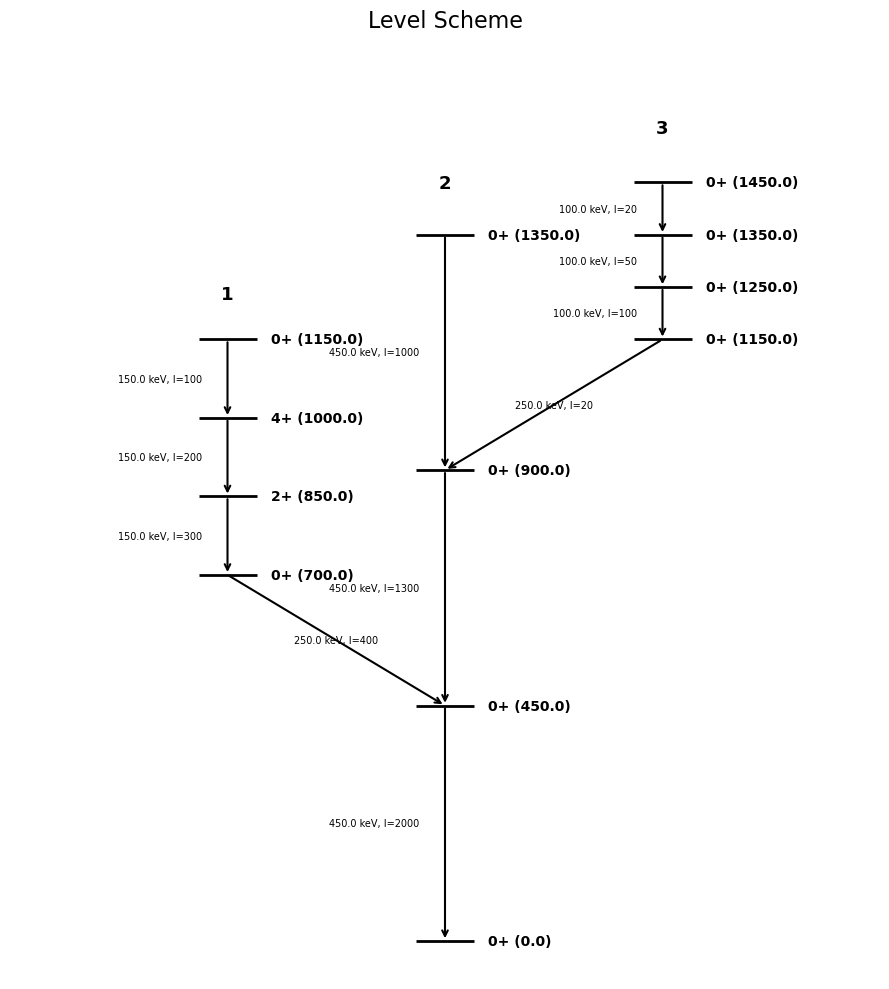

In [41]:
scheme = LevelScheme()

ground_band = scheme.add_band("1")
beta_band = scheme.add_band("2")
alpha_band = scheme.add_band("3")

bands = [ground_band, beta_band]
levels_grouped = [[(0, 0, '+', 1000), (100, 2, '+', 800), (250, 4, '+', 600)], [(600, 0, '+', 300), (700, 2, '+', 150)]]

#for band, levels in zip(bands, levels_grouped):
    #for energy, spin, parity, population in levels:
       # band.add_level(energy, spin, parity, population)
       # print(band, 'b in progress')
    #scheme.add_transitions

    
   # print(band, 'band')
   # print(levels, 'levels')

g0 = ground_band.add_level(700, 0, '+', 400)
g1 = ground_band.add_level(850, 2, '+', 300)
g2 = ground_band.add_level(1000, 4, '+', 200)
g3 = ground_band.add_level(1150, 0, '+', 100)

b0 = beta_band.add_level(0, 0, '+', 3000)
b1 = beta_band.add_level(450, 0, '+', 2000)
b2 = beta_band.add_level(900, 0, '+', 1300)
b3 = beta_band.add_level(1350, 0, '+', 1000)

a0 = alpha_band.add_level(1150, 0, '+', 200)
a1 = alpha_band.add_level(1250, 0, '+', 100)
a2 = alpha_band.add_level(1350, 0, '+', 50)
a3 = alpha_band.add_level(1450, 0, '+', 20)





scheme.add_transition(g3, g2, intensity=g3.population)
scheme.add_transition(g2, g1, intensity=g2.population)
scheme.add_transition(g1, g0, intensity=g1.population)
scheme.add_transition(g0, b1, intensity=g0.population)



scheme.add_transition(b3, b2, intensity=b3.population)
scheme.add_transition(b2, b1, intensity=b2.population)
scheme.add_transition(b1, b0, intensity=b1.population)

scheme.add_transition(a3, a2, intensity=a3.population)
scheme.add_transition(a2, a1, intensity=a2.population)
scheme.add_transition(a1, a0, intensity=a1.population)
scheme.add_transition(a0, b2, intensity=a3.population)










#print(g2.get_outgoing_transitions(), 'yup')


def down_maker(level, visited_levels=None, seen_transitions=None):
    if visited_levels is None:
        visited_levels = set()
    if seen_transitions is None:
        seen_transitions = set()

    if id(level) in visited_levels:
        return []
    visited_levels.add(id(level))

    results = []
    for t in level.get_outgoing_transitions():
        if id(t) not in seen_transitions:
            results.append(t)
            seen_transitions.add(id(t))
        results.extend(down_maker(t.to_level, visited_levels, seen_transitions))
    return results






def up_maker(level, visited_levels=None, seen_transitions=None):
    """
    Collect unique transitions that feed into `level`, recursively.
    """
    if visited_levels is None:
        visited_levels = set()
    if seen_transitions is None:
        seen_transitions = set()

    # Stop if we've already processed this level (prevents cycles)
    if id(level) in visited_levels:
        return []
    visited_levels.add(id(level))

    results = []
    for t in level.get_incoming_transitions():
        # Add this transition once
        if id(t) not in seen_transitions:
            results.append(t)
            seen_transitions.add(id(t))
        # Recurse upward from the source of this transition
        results.extend(up_maker(t.from_level, visited_levels, seen_transitions))
    return results


print(scheme)

#print(band_transitions(scheme))

downs = down_maker(b1)
ups = up_maker(b1)
ordered_energys = [i.energy_diff for i in downs]
ordered_counts = [i.intensity for i in downs]
print(ordered_energys, 'downs')
print(ordered_counts, 'downs')

ordered_energys = [i.energy_diff for i in ups]
ordered_counts = [i.intensity for i in ups]

print(ups, 'uppies')
print(ordered_energys, 'ups')
print(ordered_counts, 'ups')

def level_analyzer(level):
    downs = down_maker(level)
    ups = up_maker(level)
    transitions = downs + ups
    energys = [i.energy_diff for i in transitions]
    counts = [i.intensity for i in transitions]

    return(energys, counts)


    
print(level_analyzer(b1), 'level analyzer')




plot_level_scheme(scheme, band_order=["1", "2", "3"])




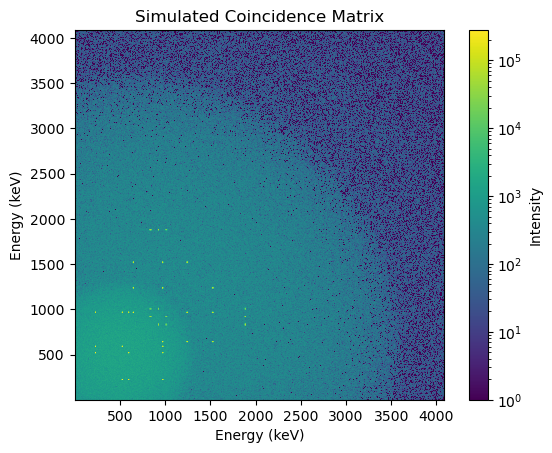

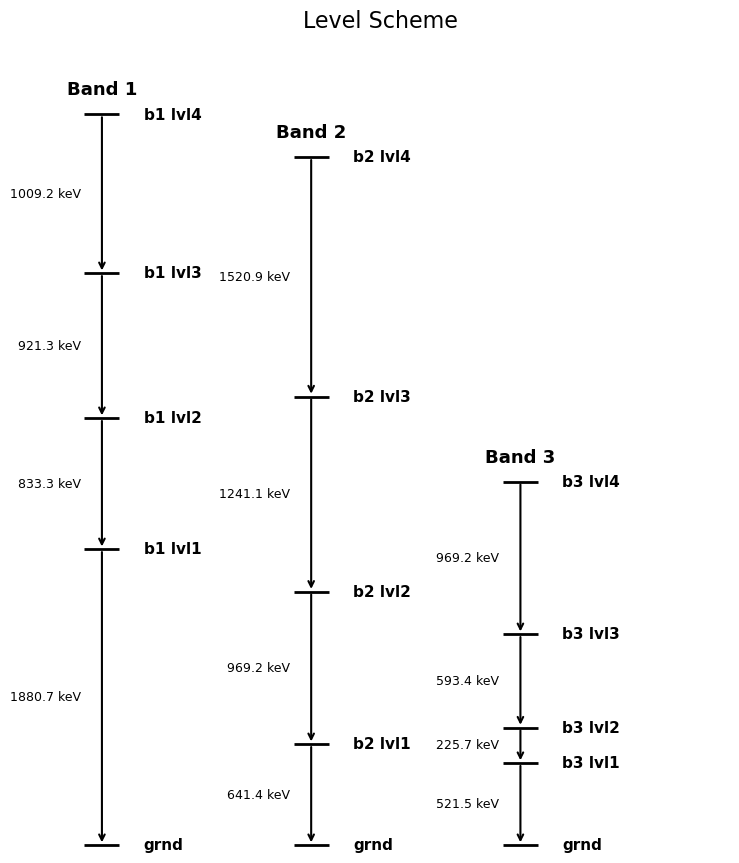

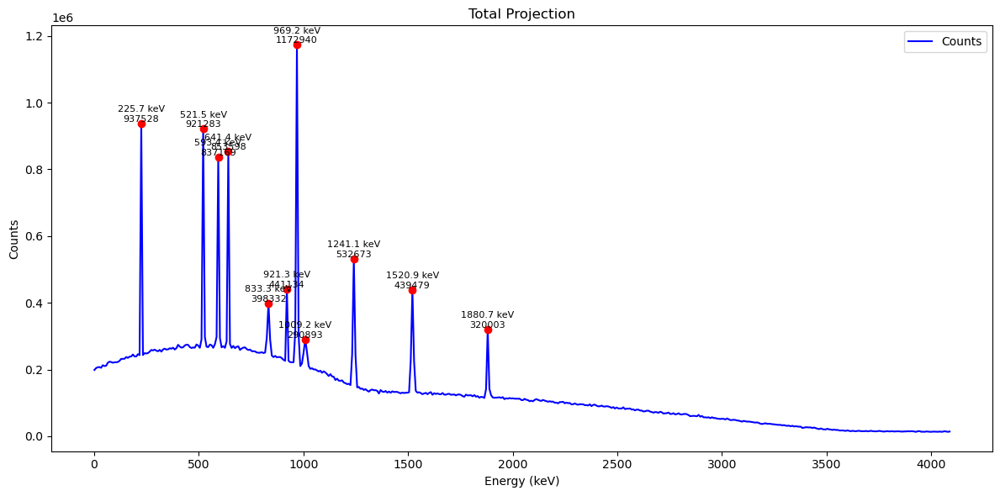

<Figure size 640x480 with 0 Axes>

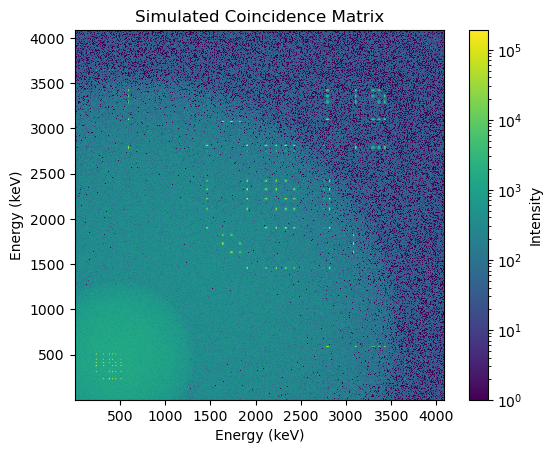

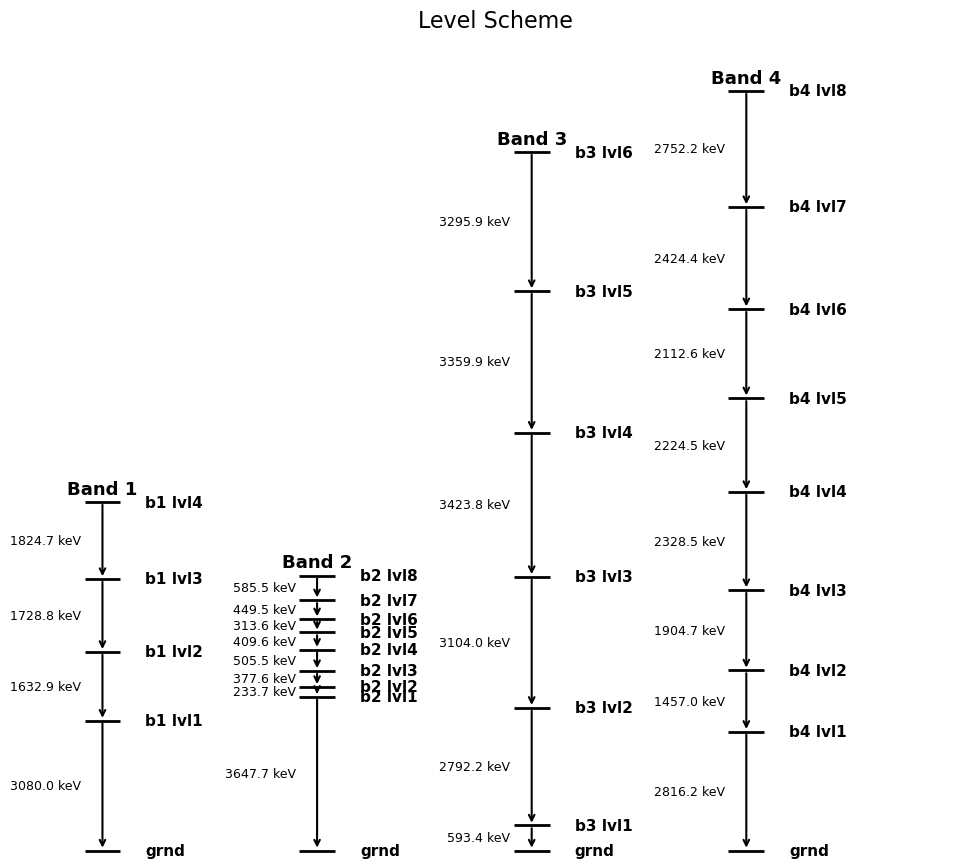

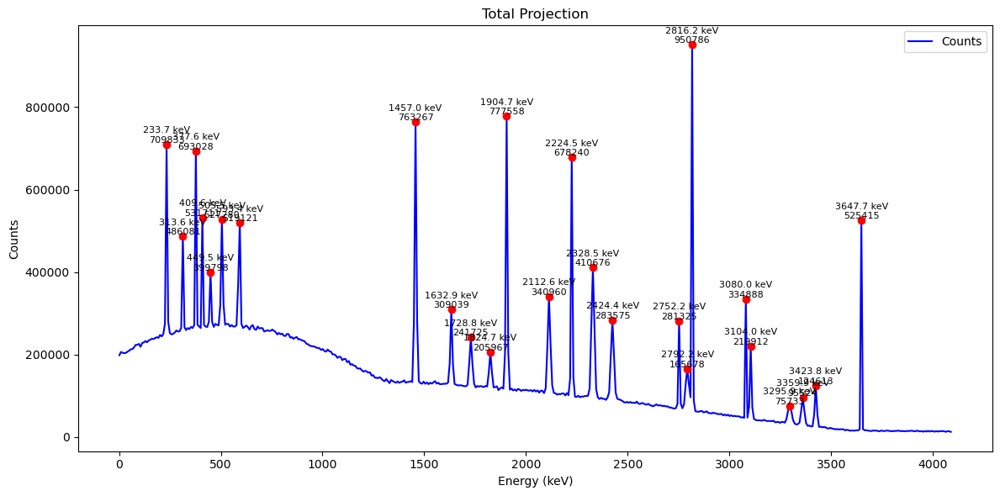

<Figure size 640x480 with 0 Axes>

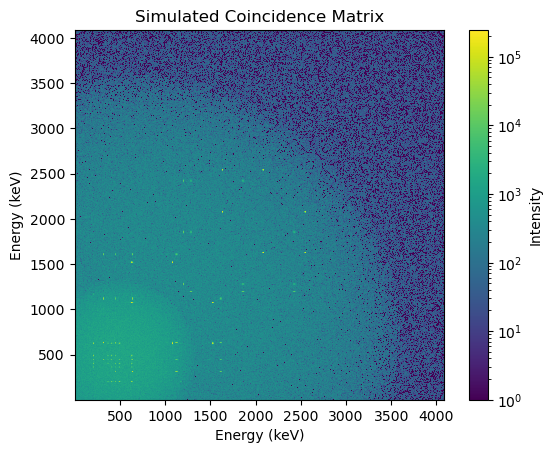

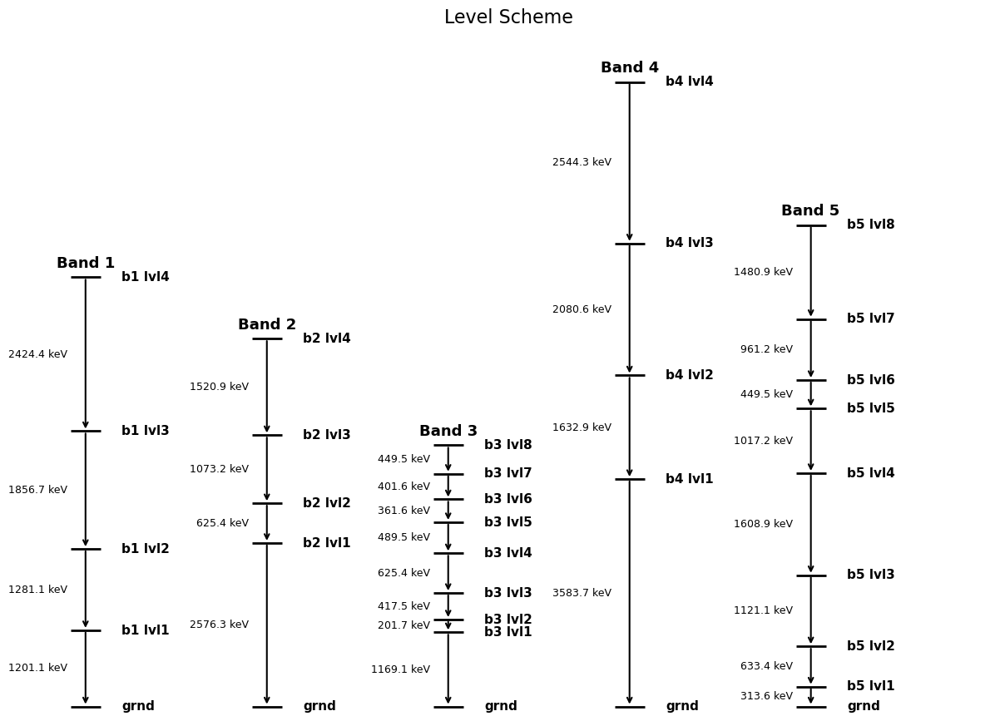

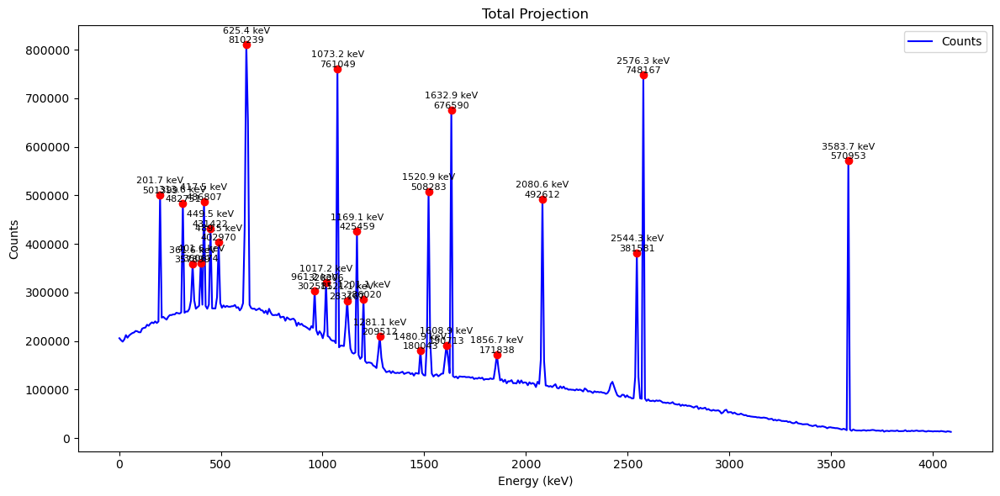

<Figure size 640x480 with 0 Axes>

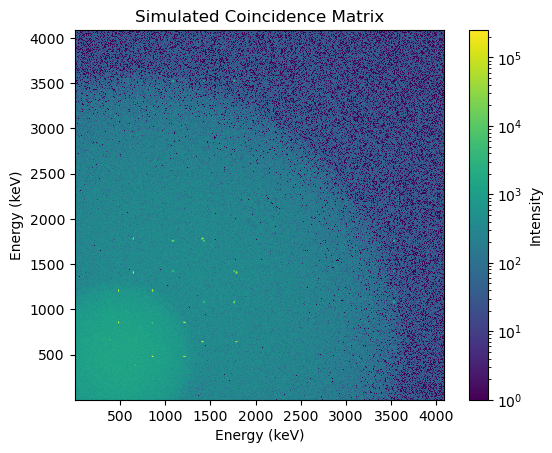

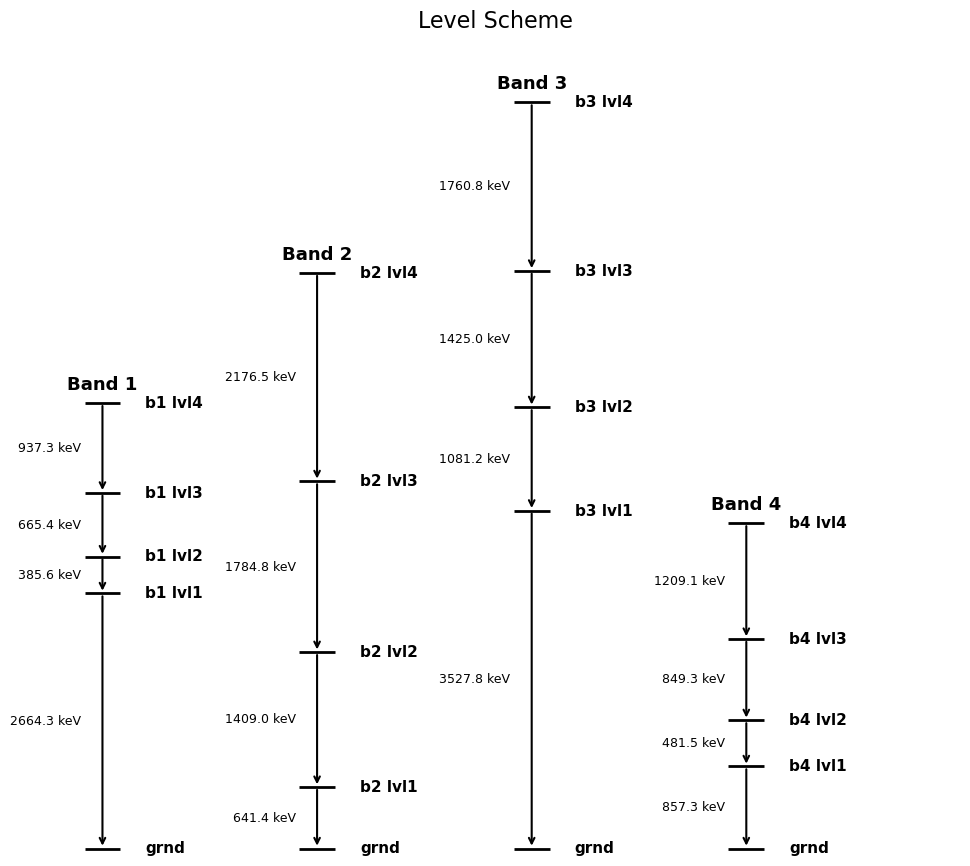

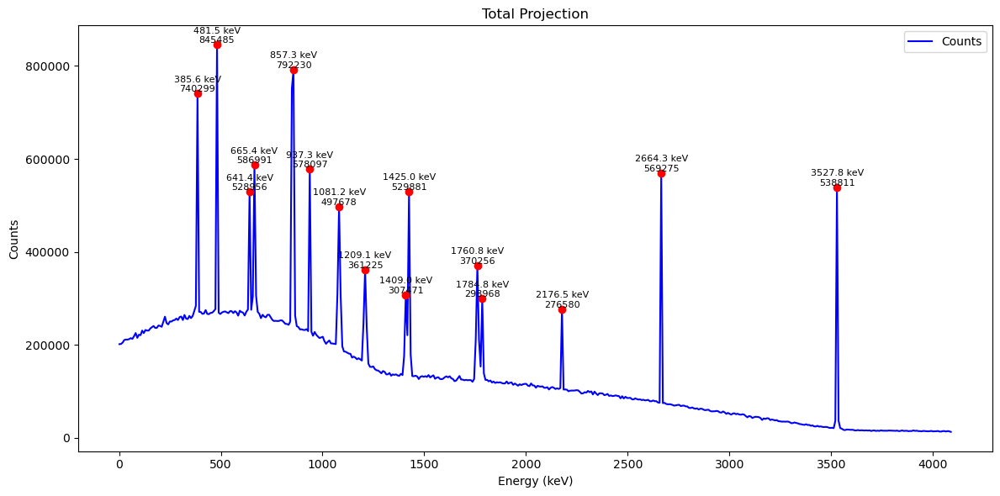

<Figure size 640x480 with 0 Axes>

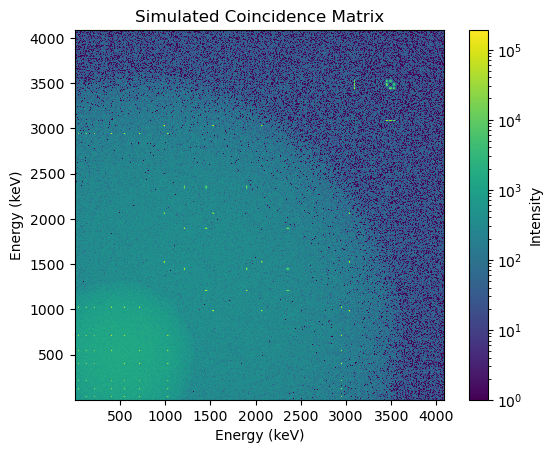

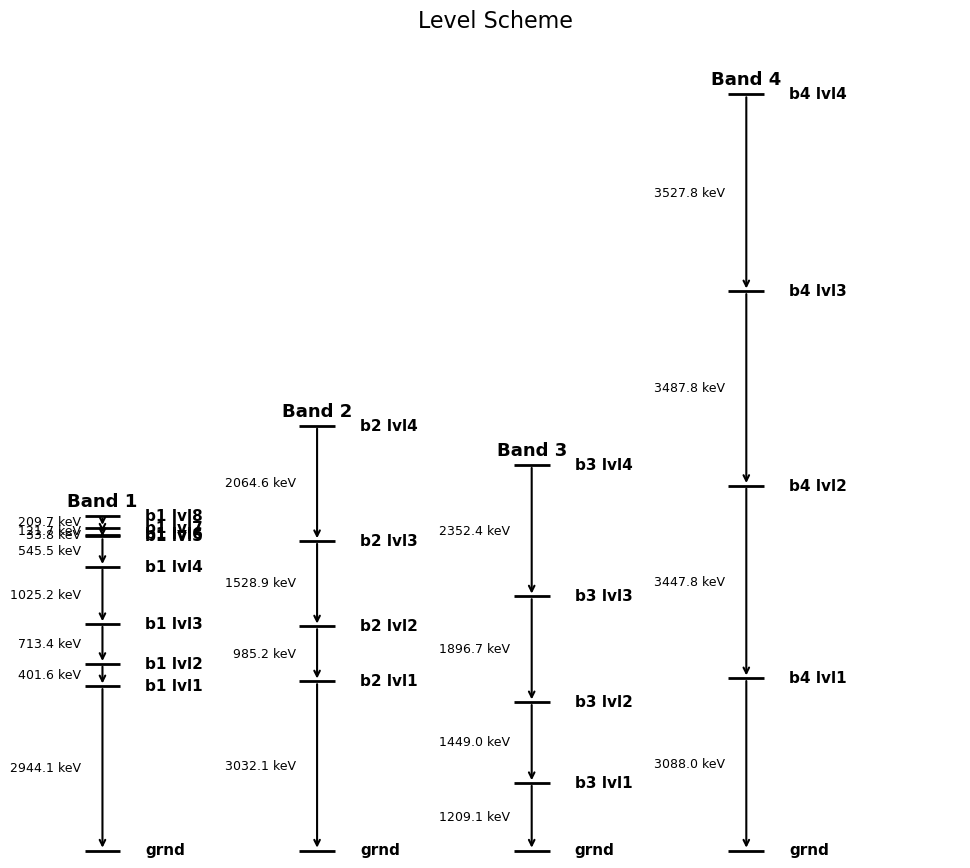

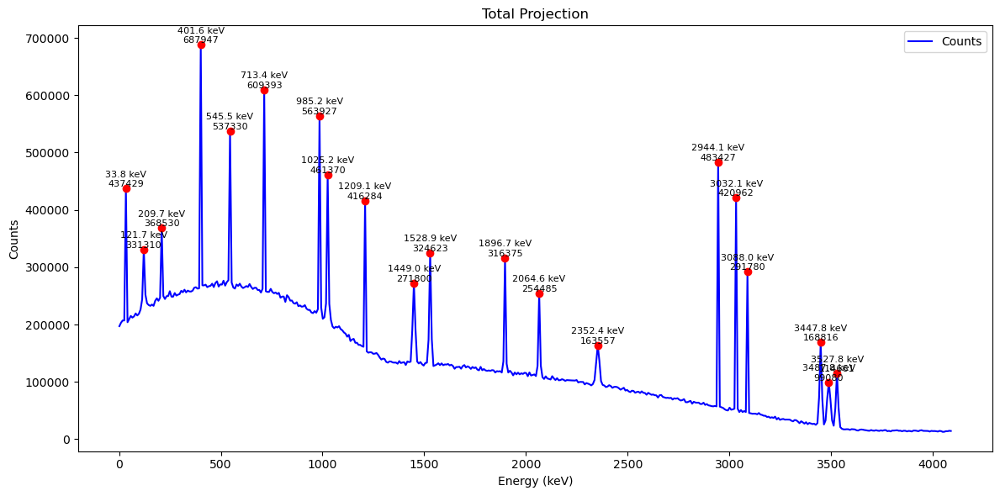

<Figure size 640x480 with 0 Axes>

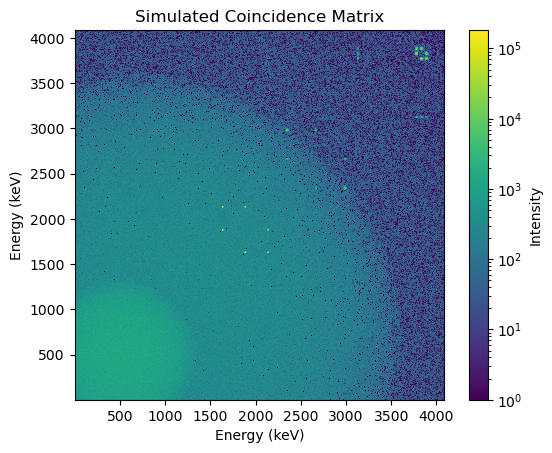

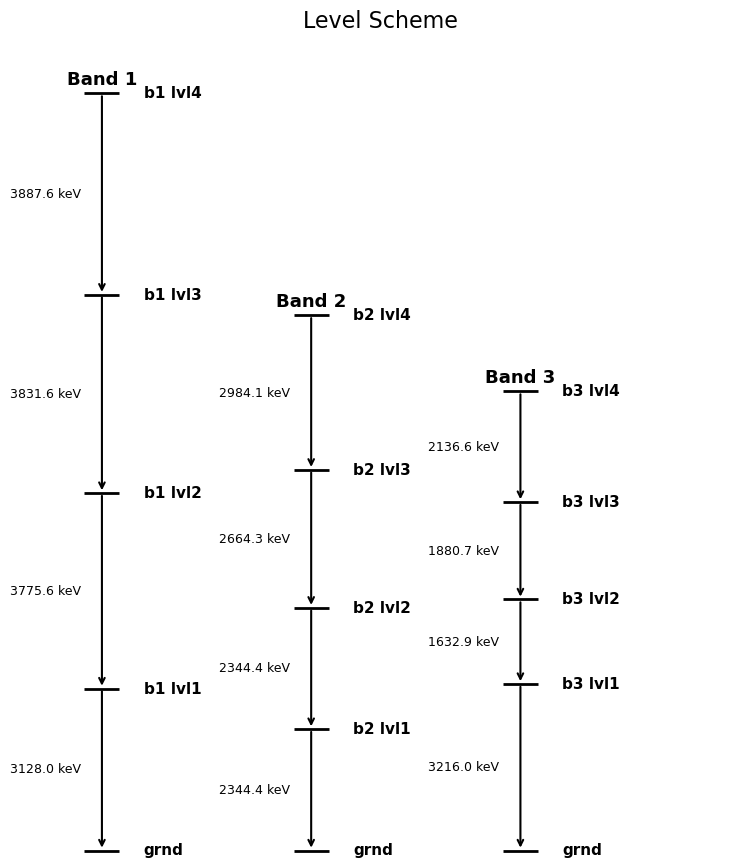

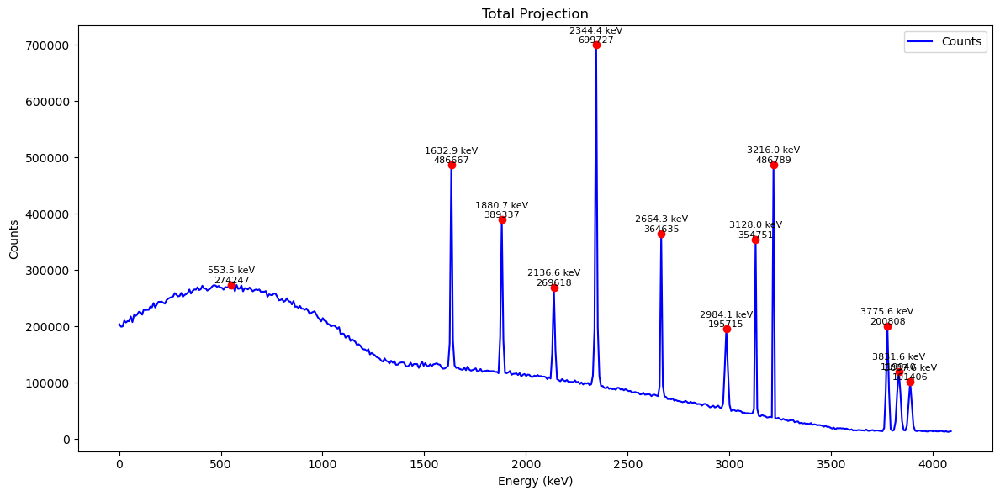

<Figure size 640x480 with 0 Axes>

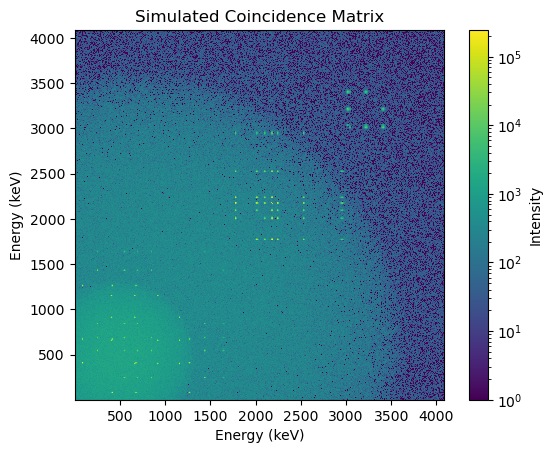

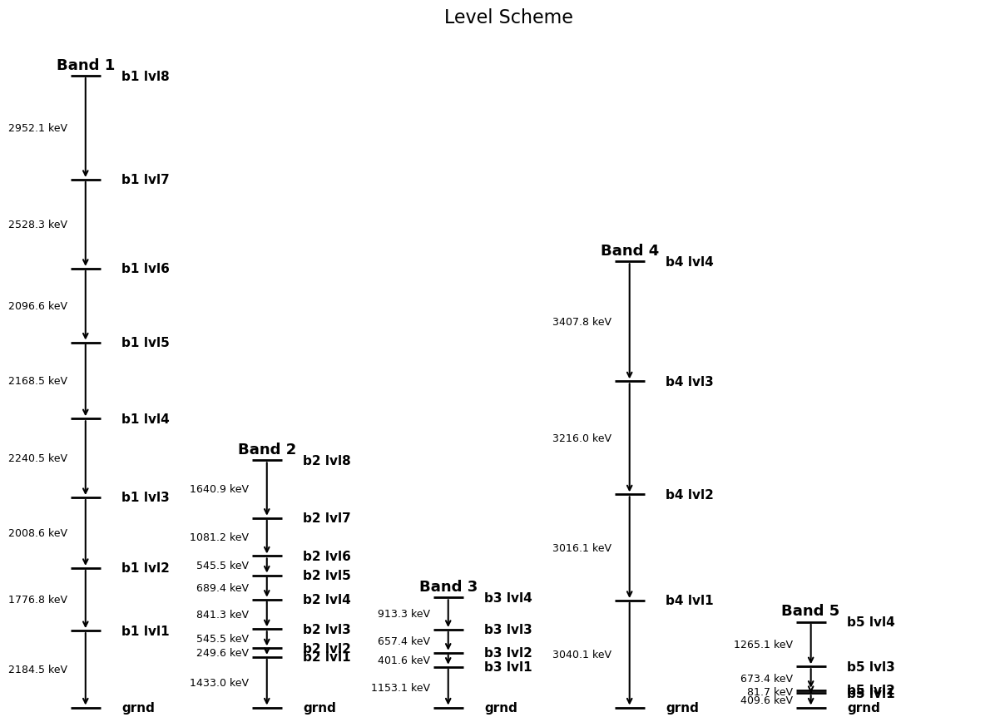

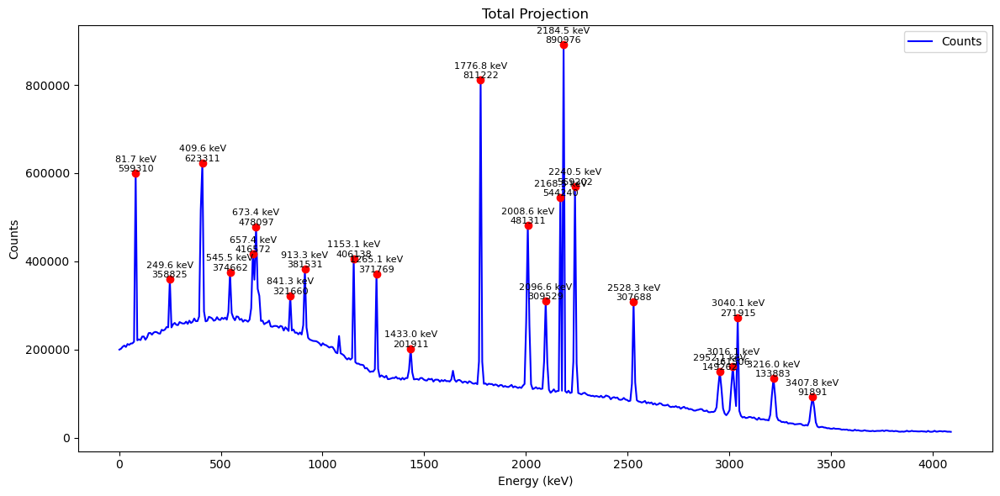

<Figure size 640x480 with 0 Axes>

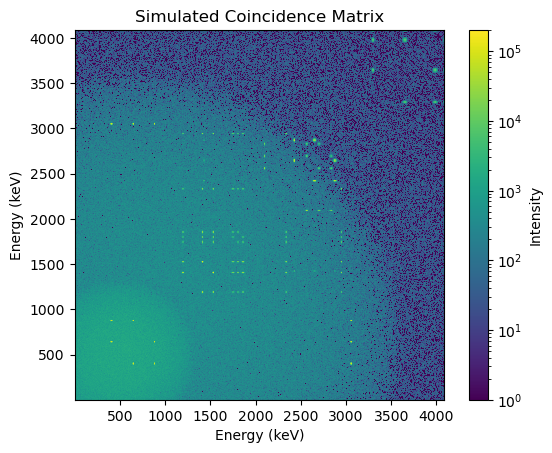

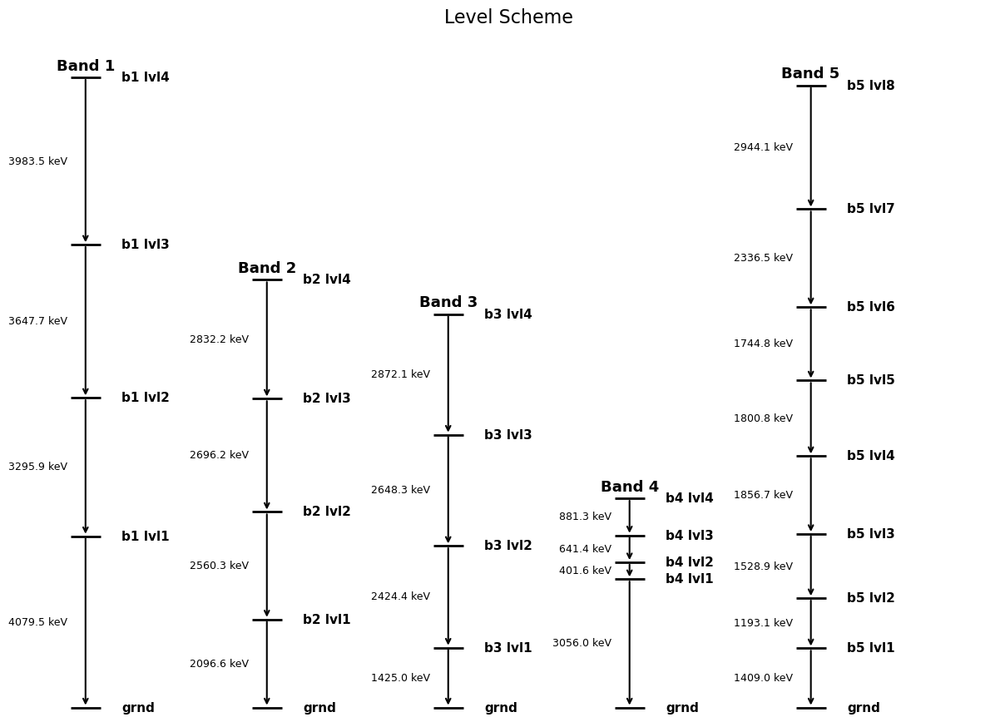

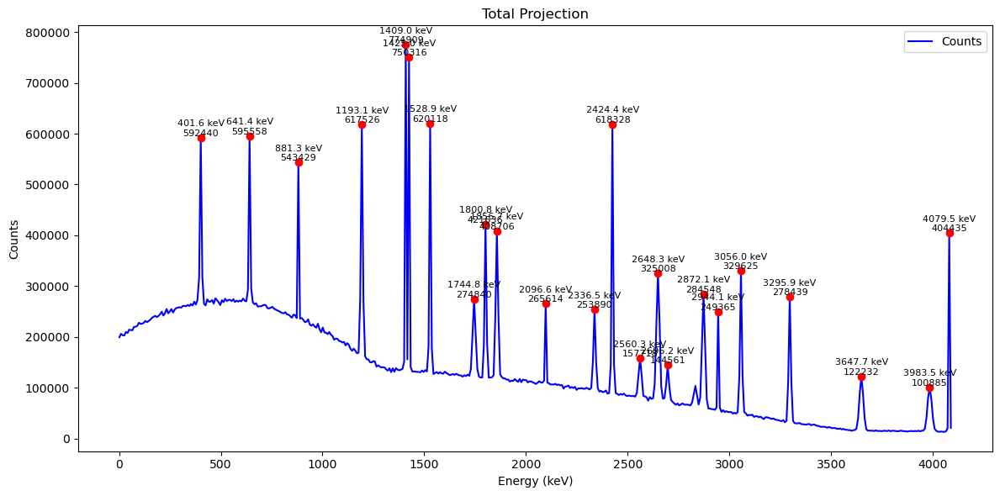

<Figure size 640x480 with 0 Axes>

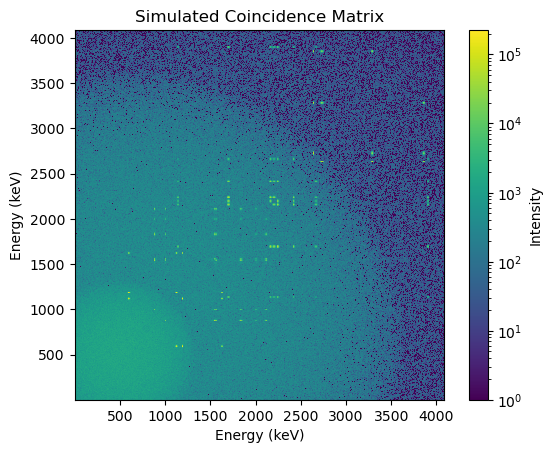

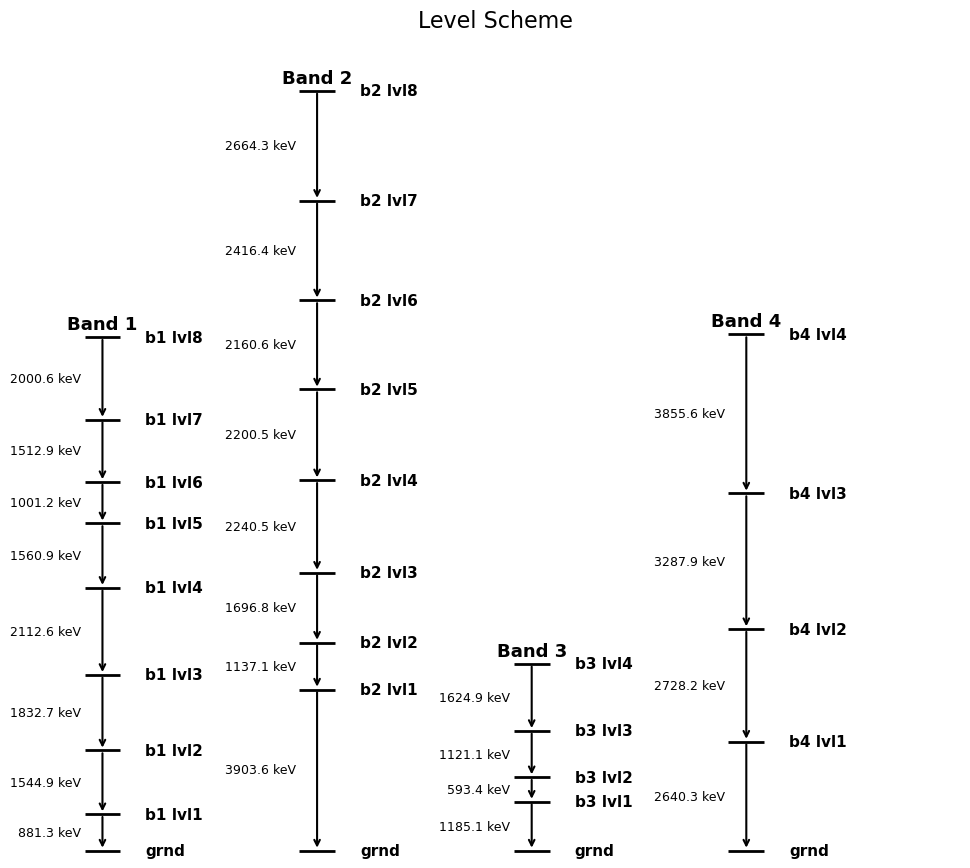

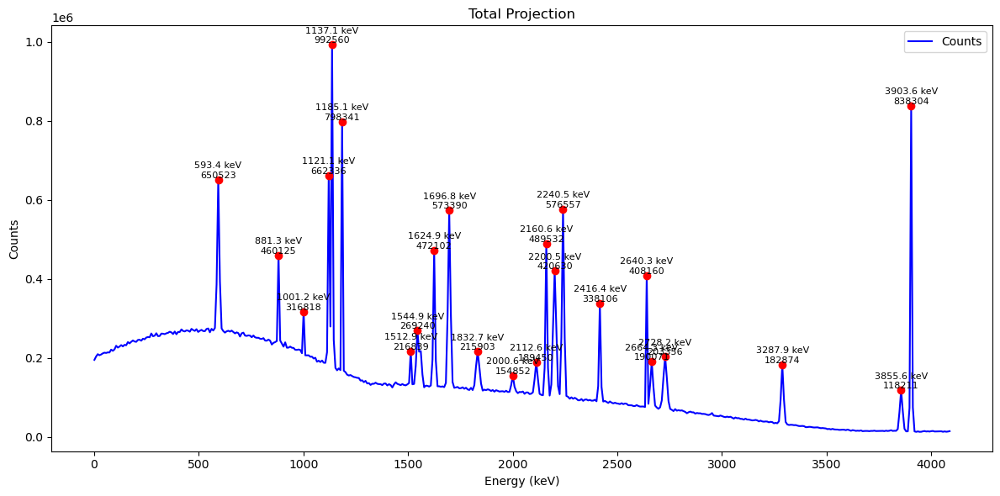

<Figure size 640x480 with 0 Axes>

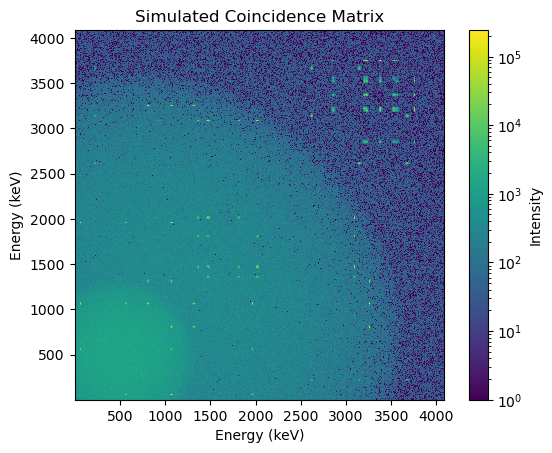

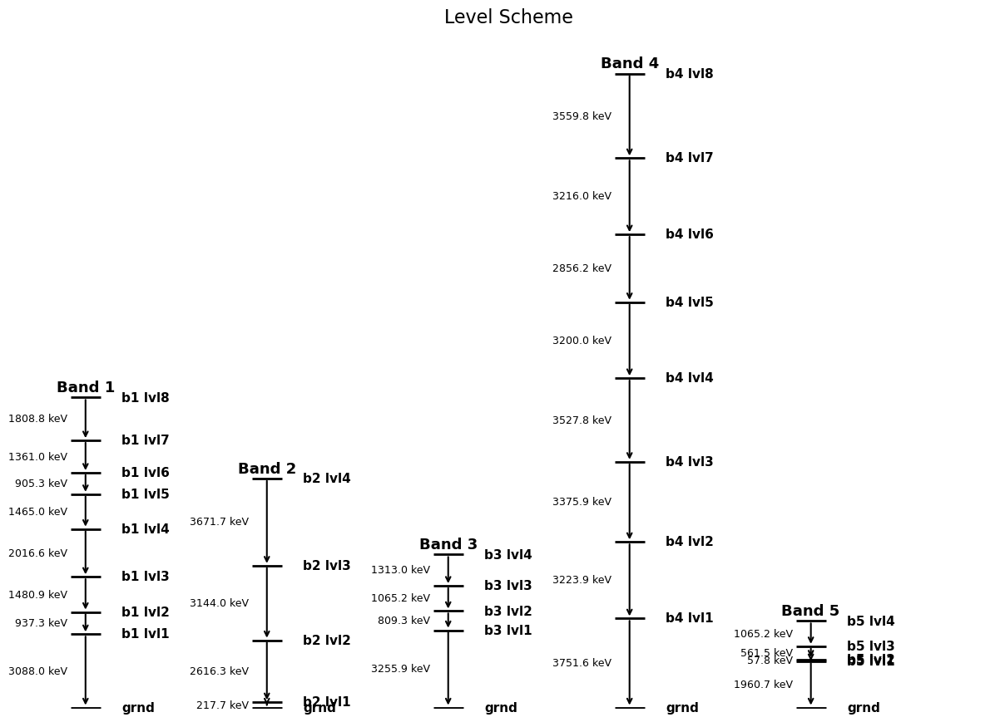

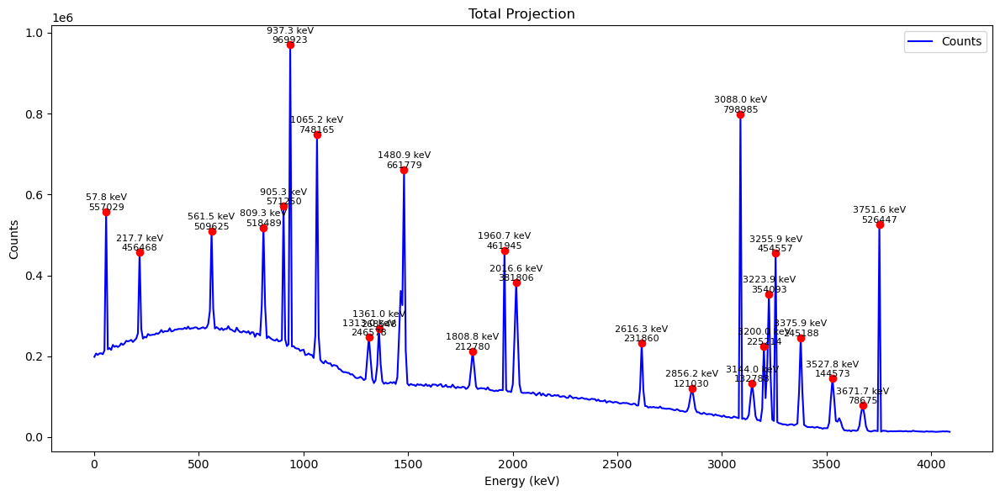

<Figure size 640x480 with 0 Axes>

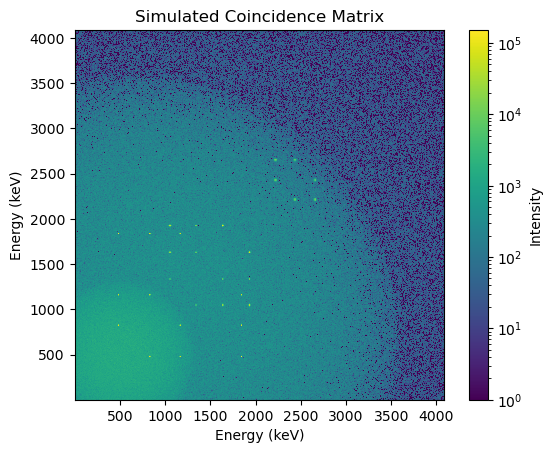

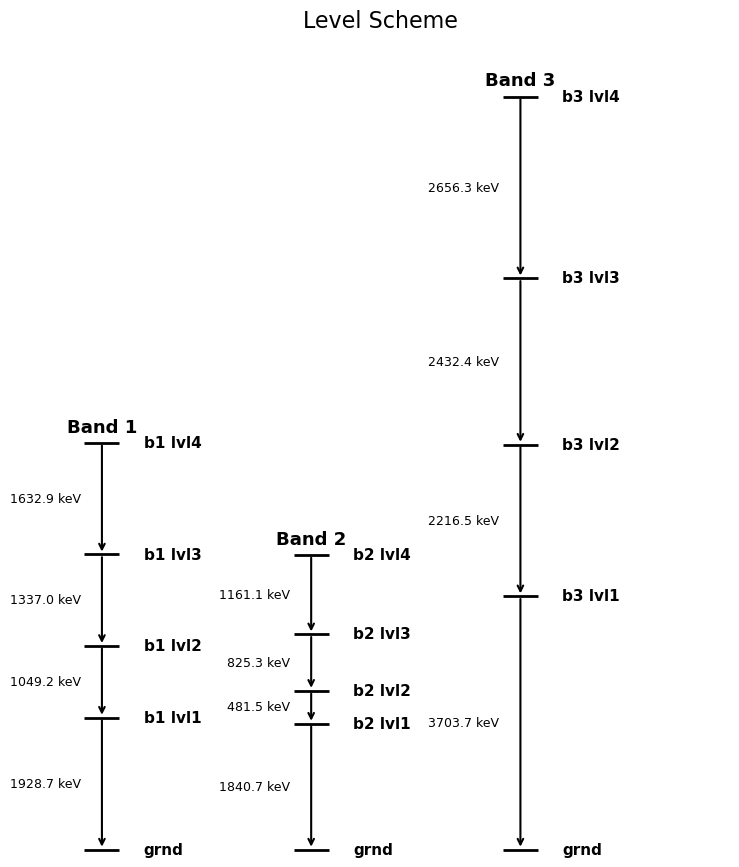

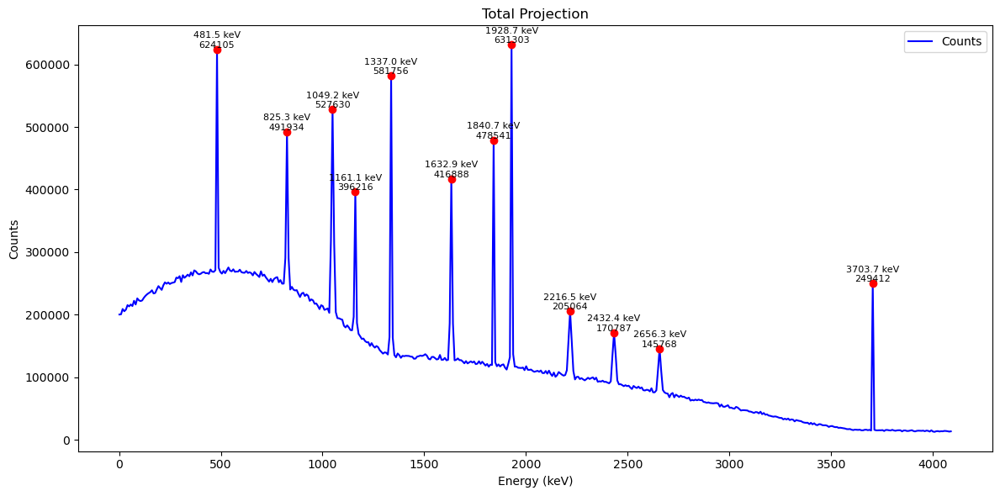

<Figure size 640x480 with 0 Axes>

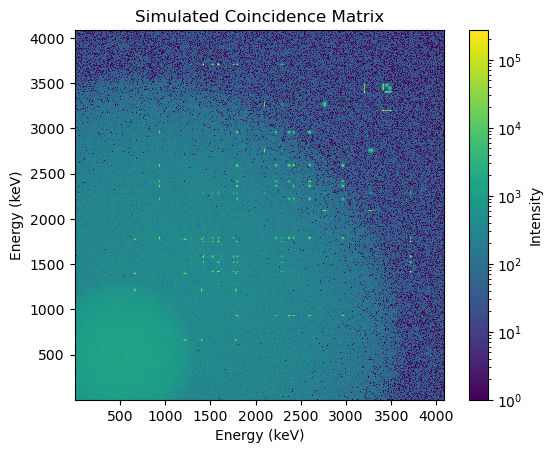

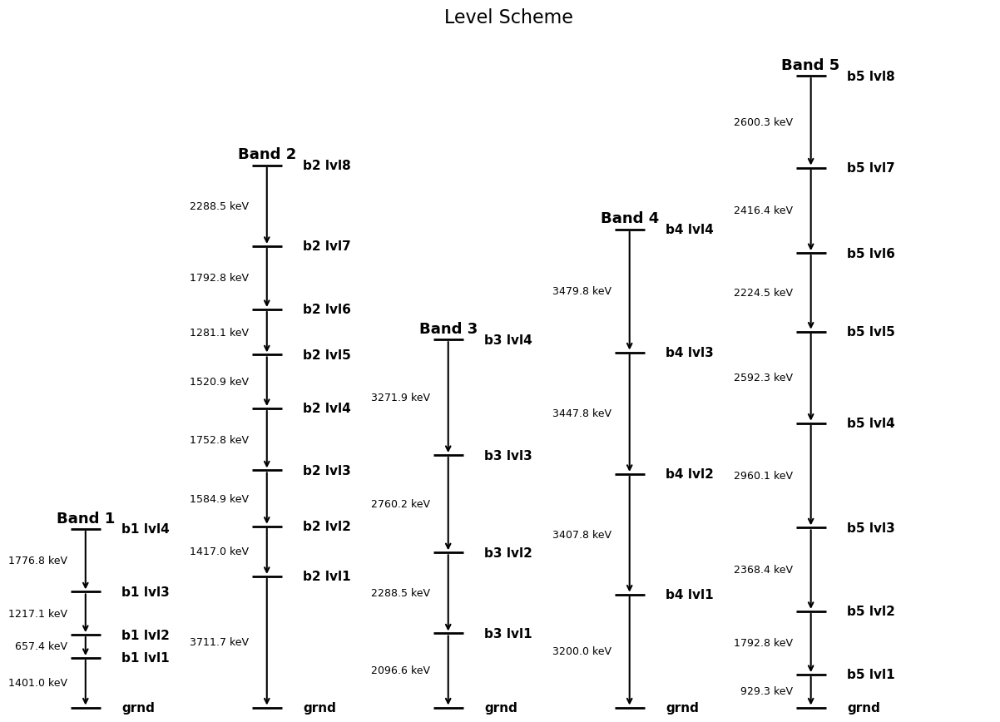

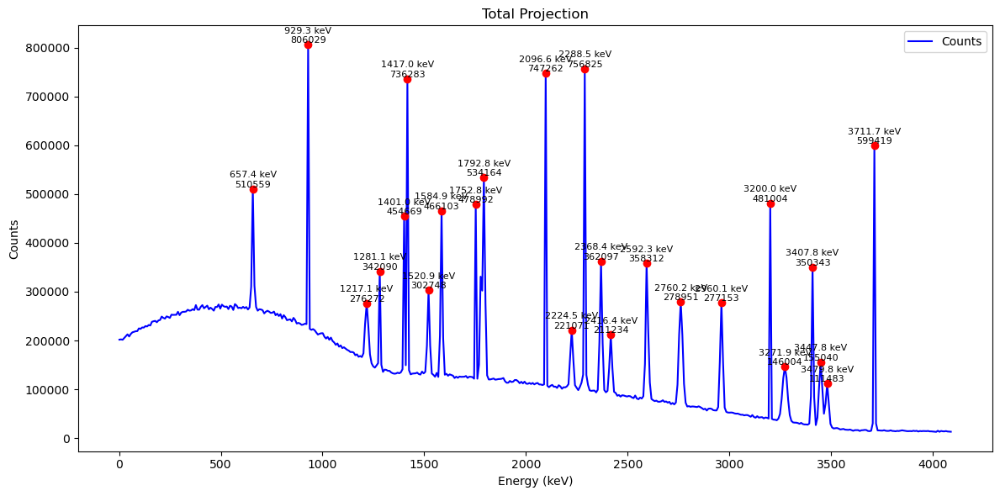

<Figure size 640x480 with 0 Axes>

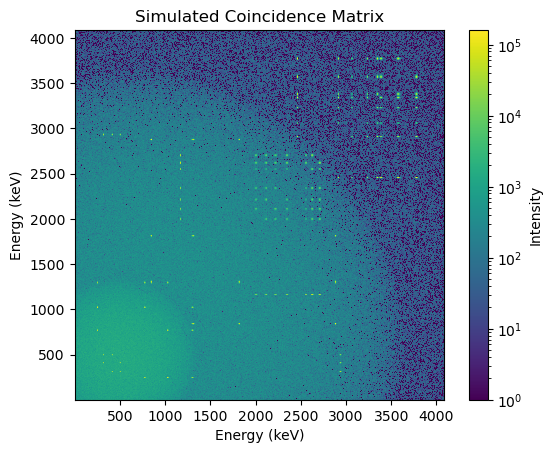

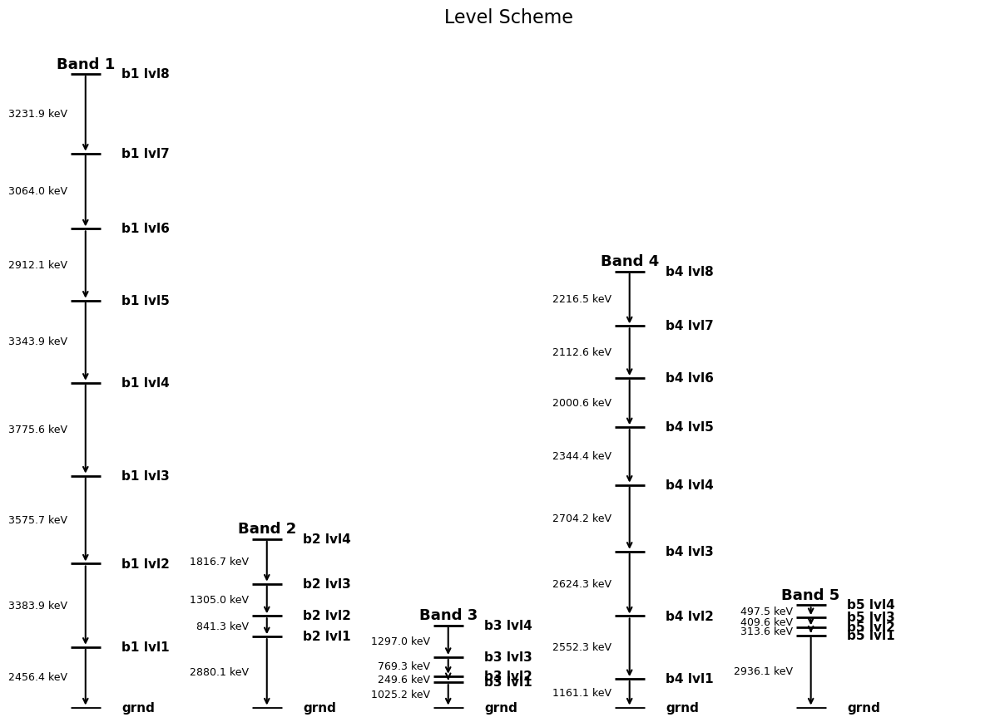

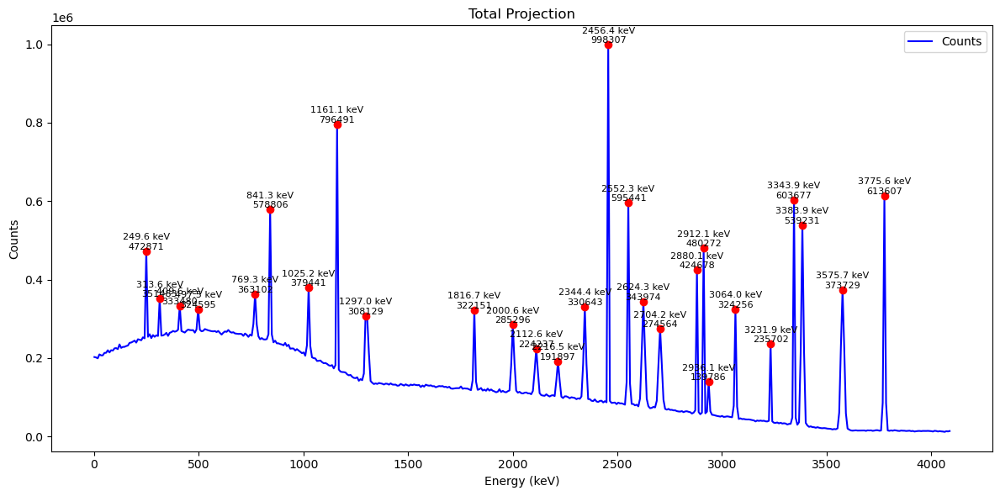

<Figure size 640x480 with 0 Axes>

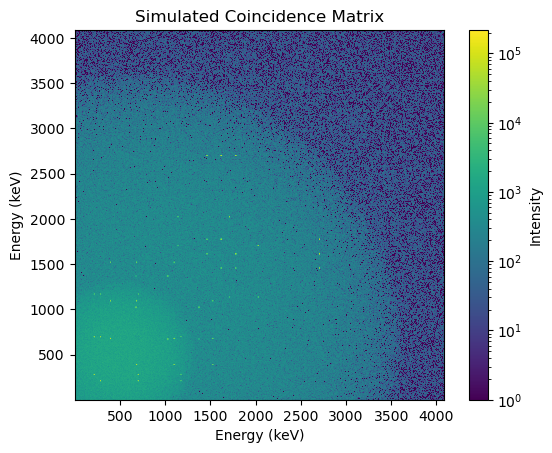

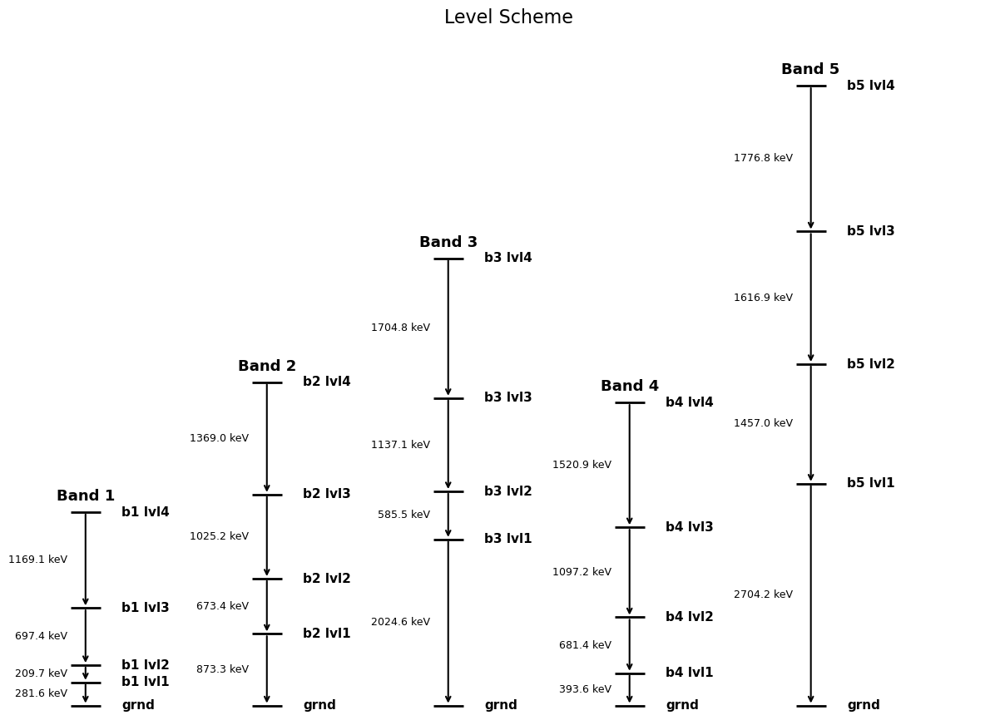

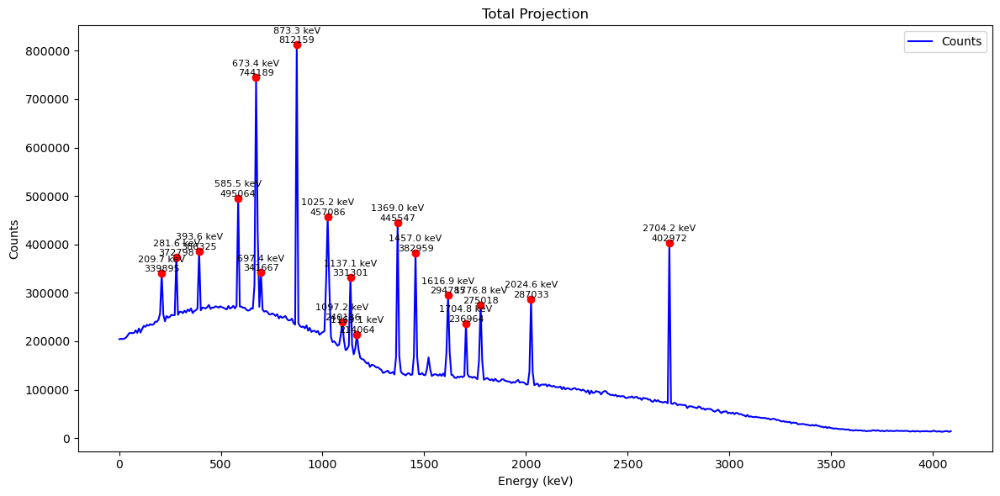

<Figure size 640x480 with 0 Axes>

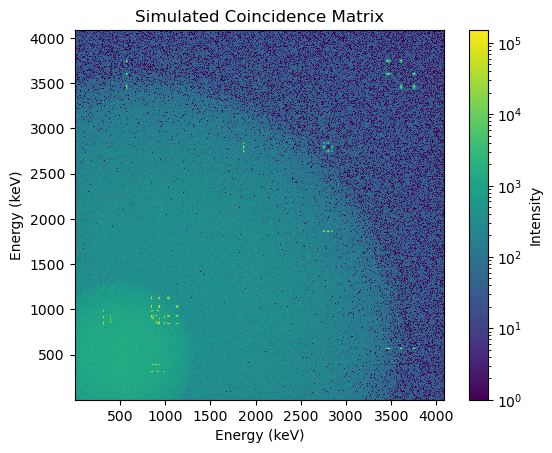

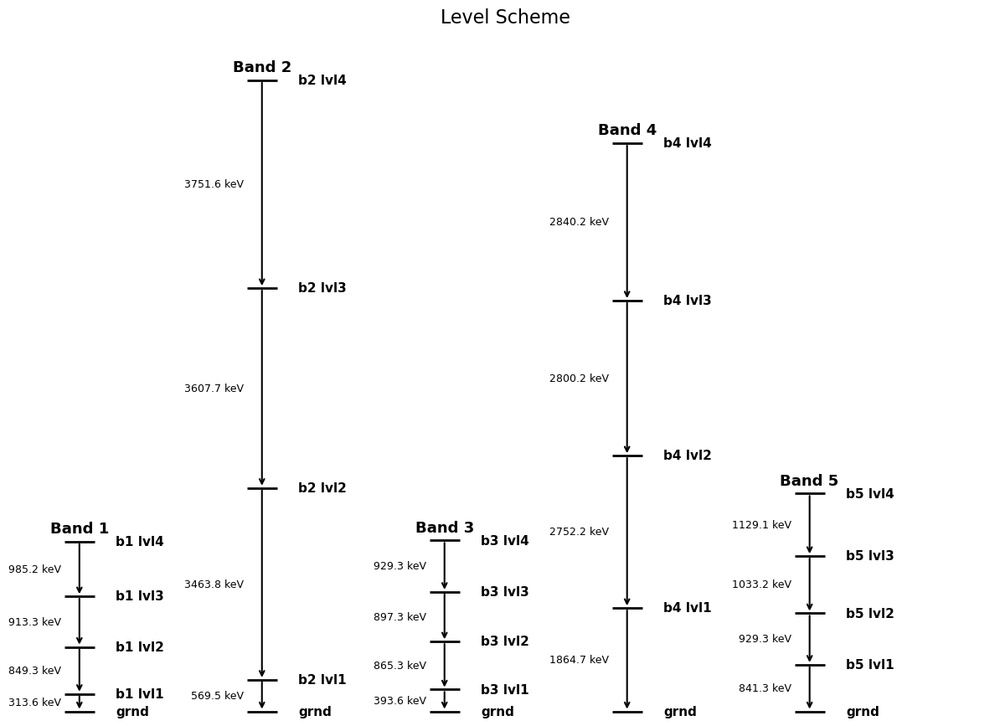

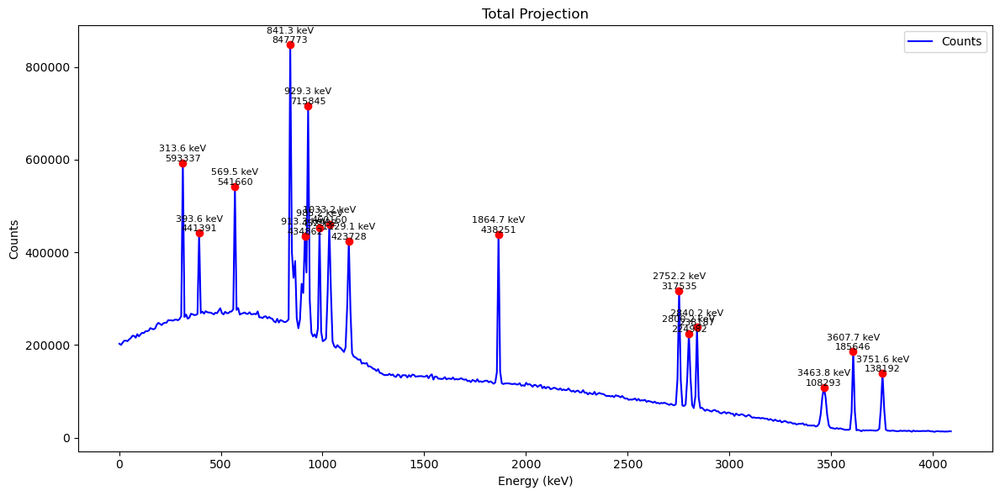

<Figure size 640x480 with 0 Axes>

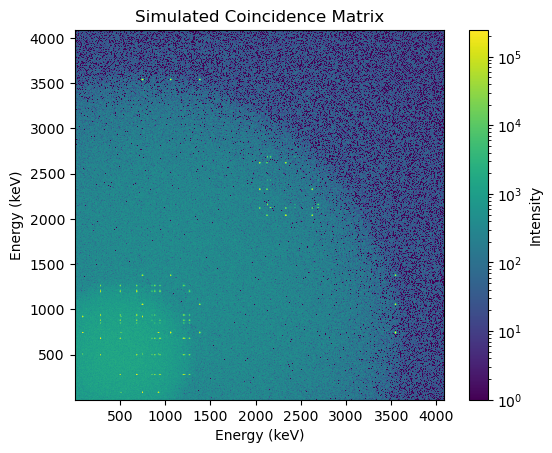

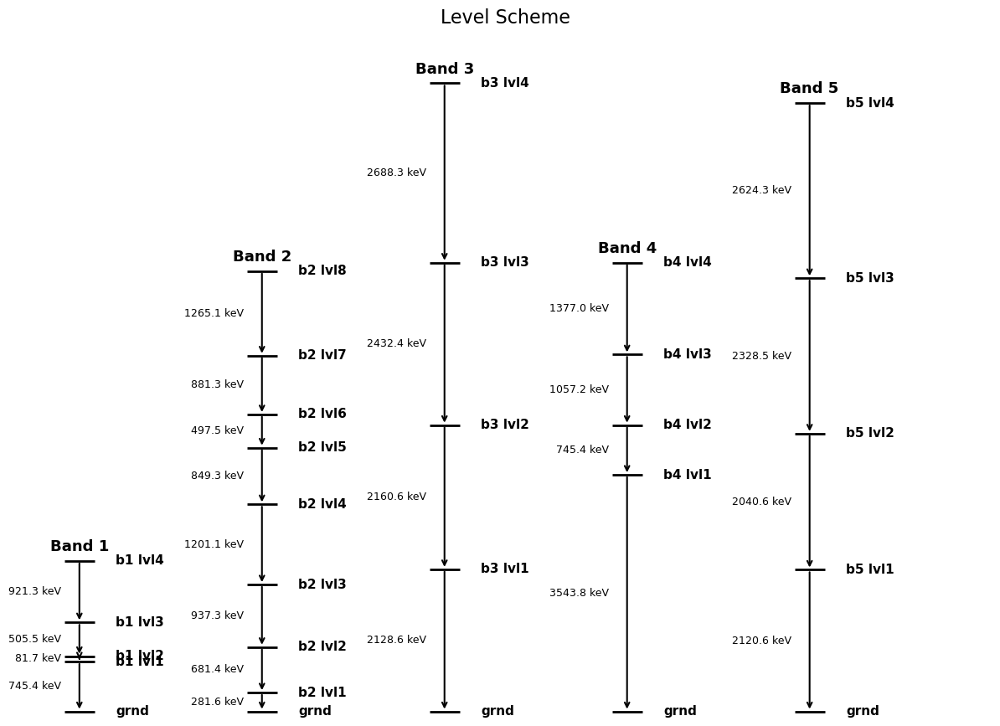

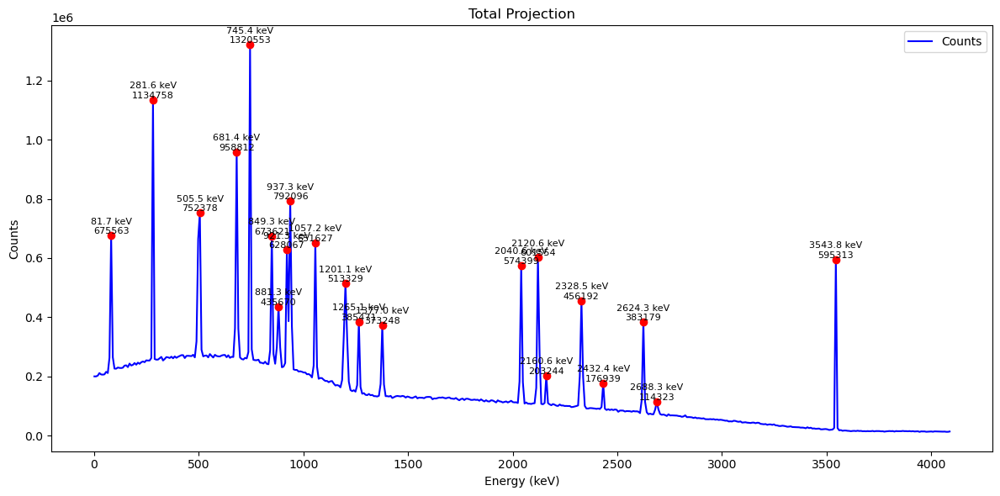

<Figure size 640x480 with 0 Axes>

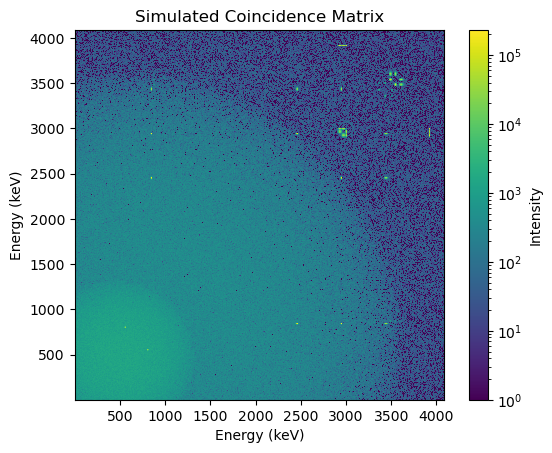

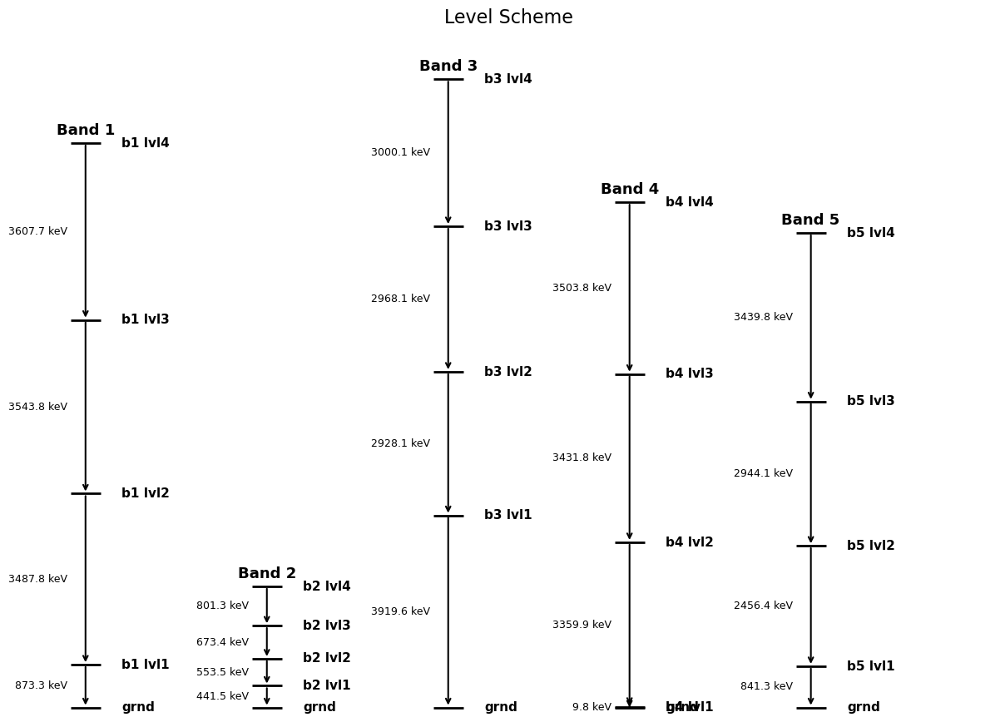

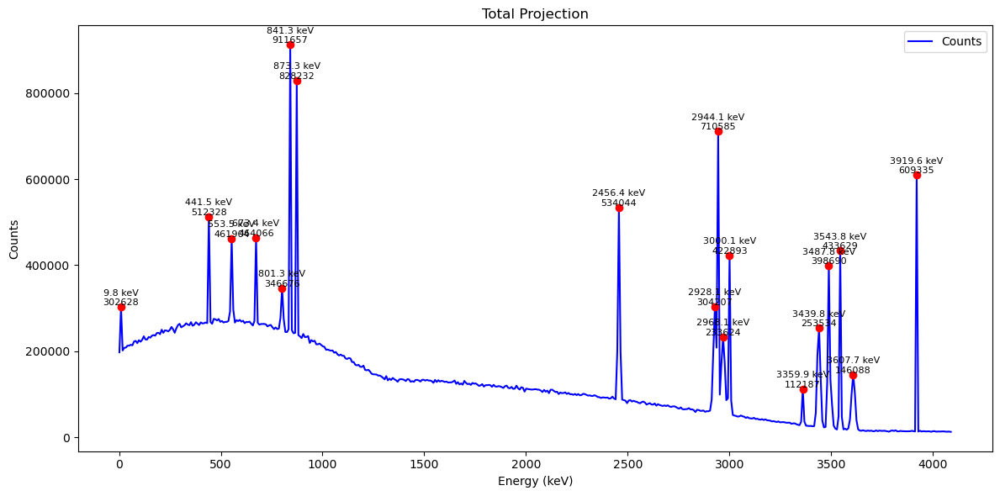

<Figure size 640x480 with 0 Axes>

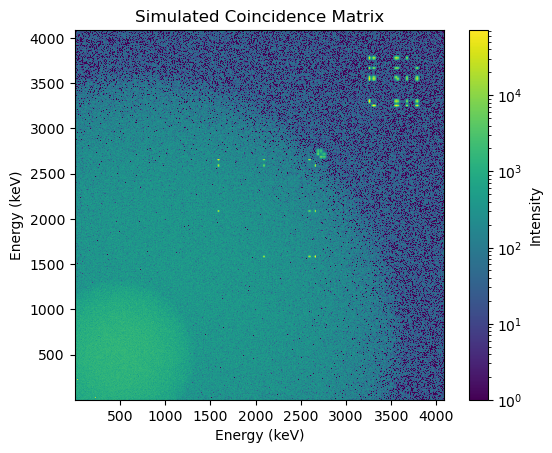

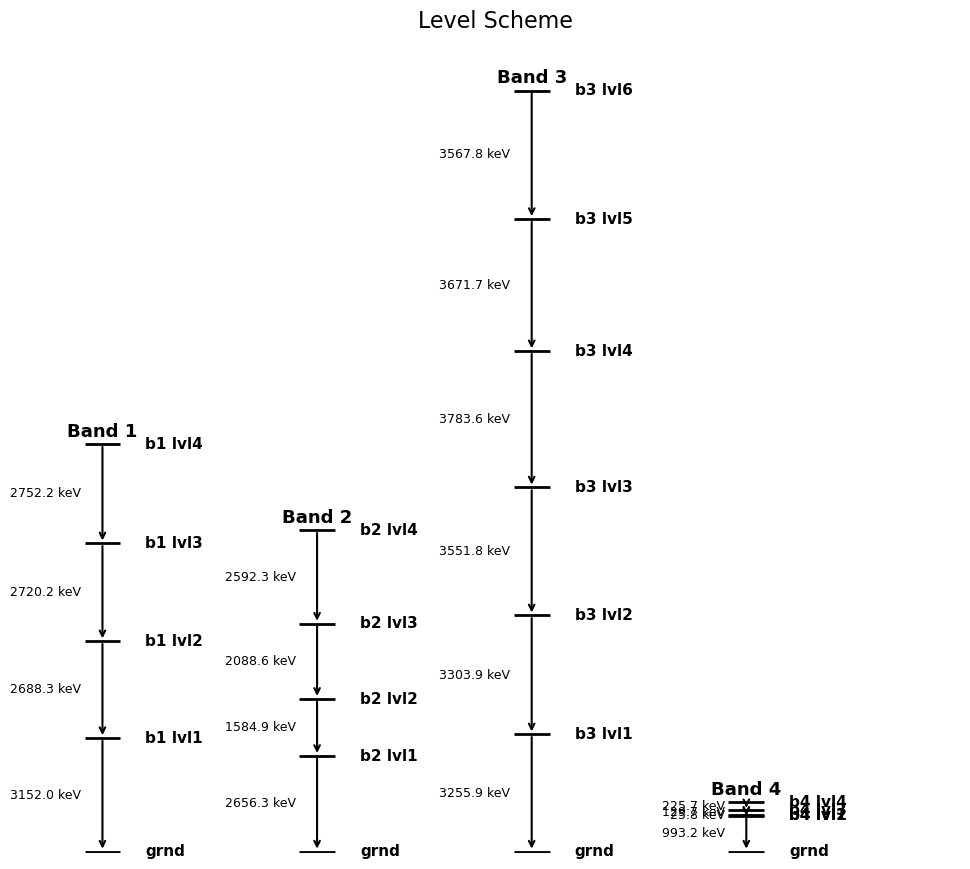

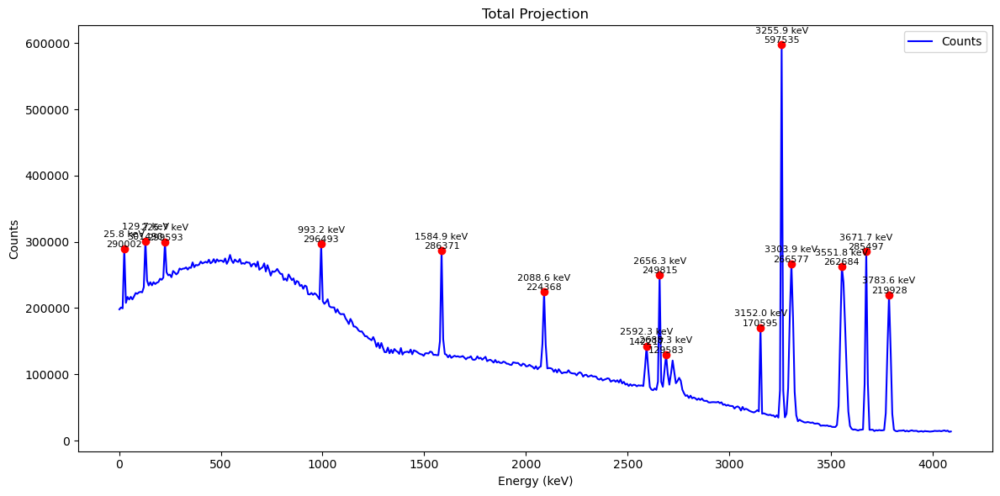

<Figure size 640x480 with 0 Axes>

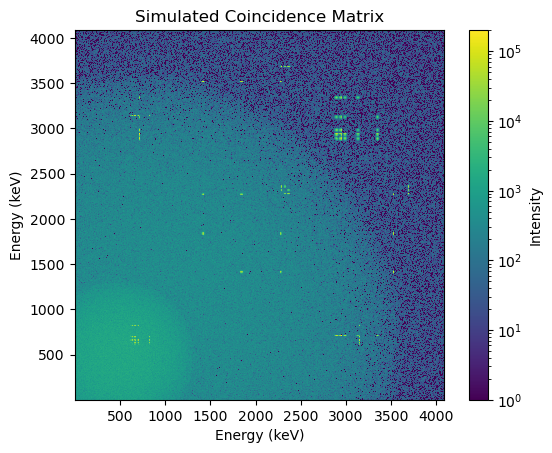

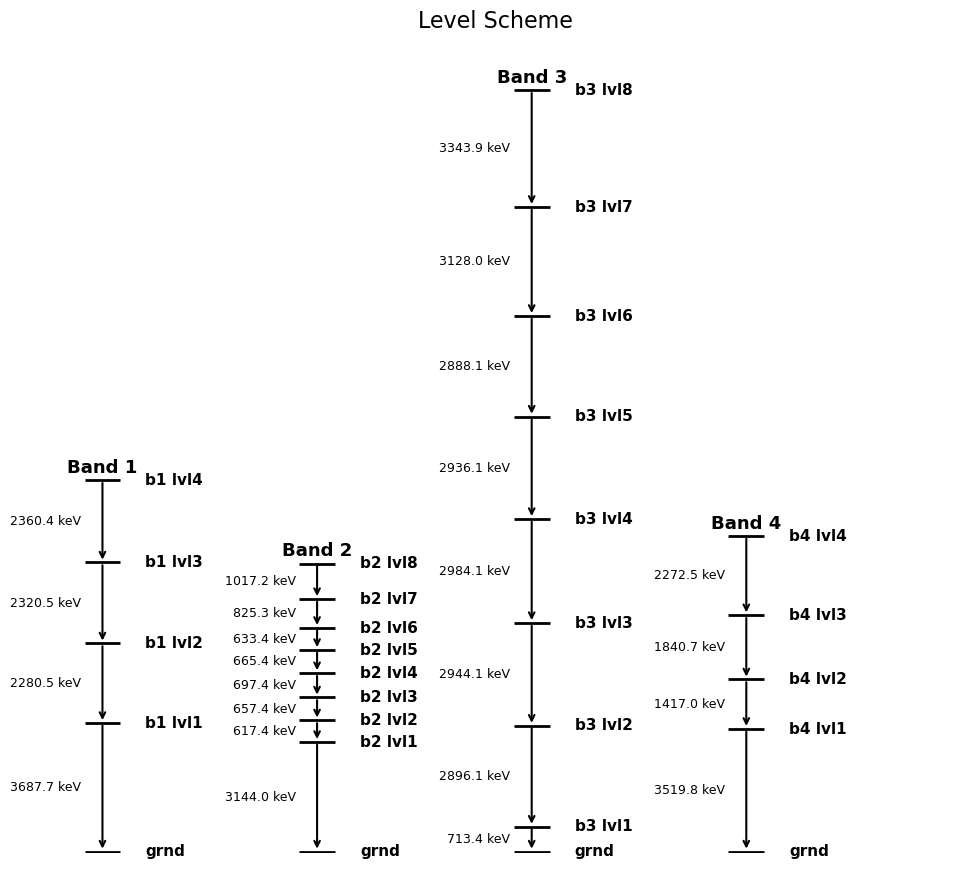

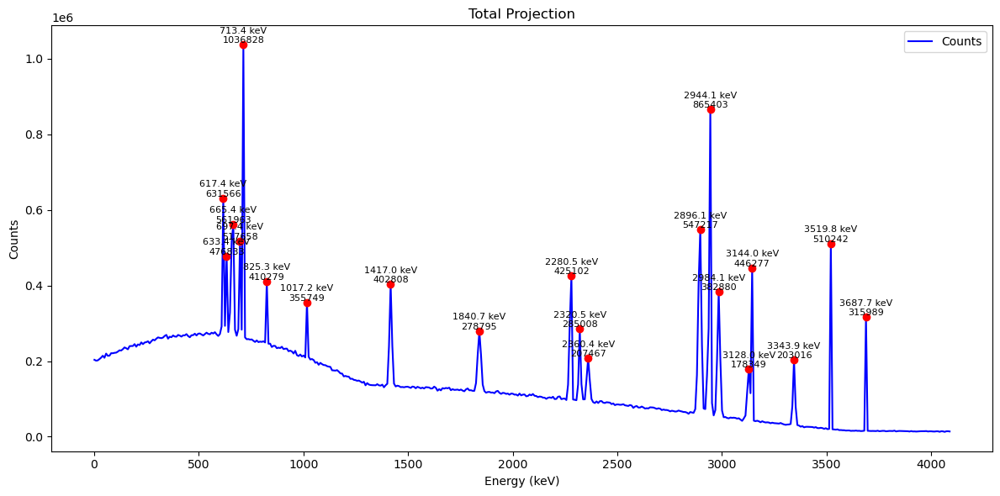

<Figure size 640x480 with 0 Axes>

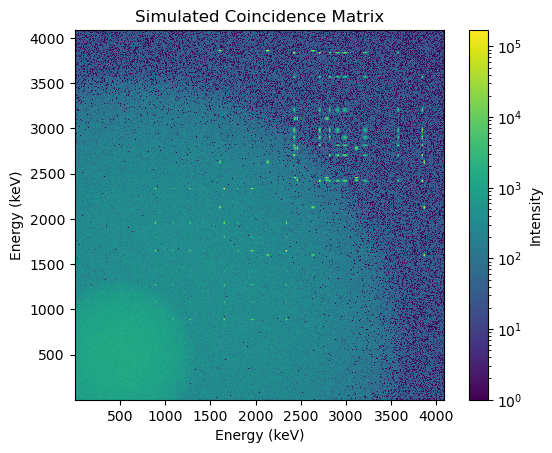

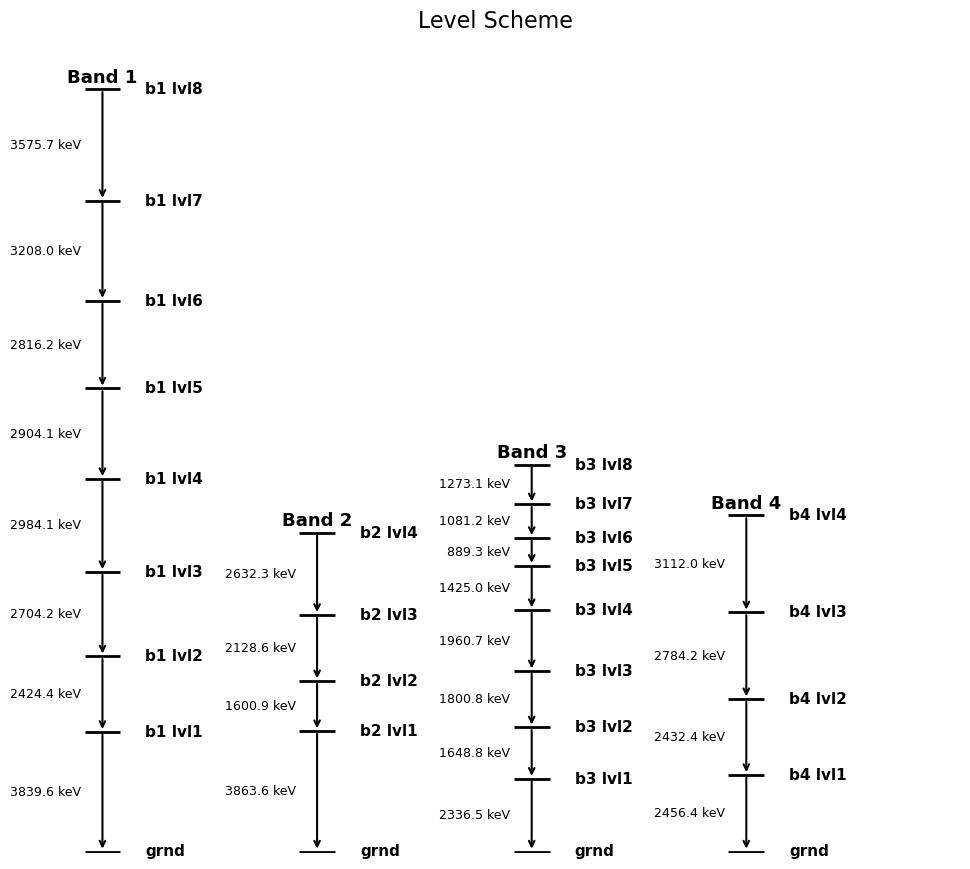

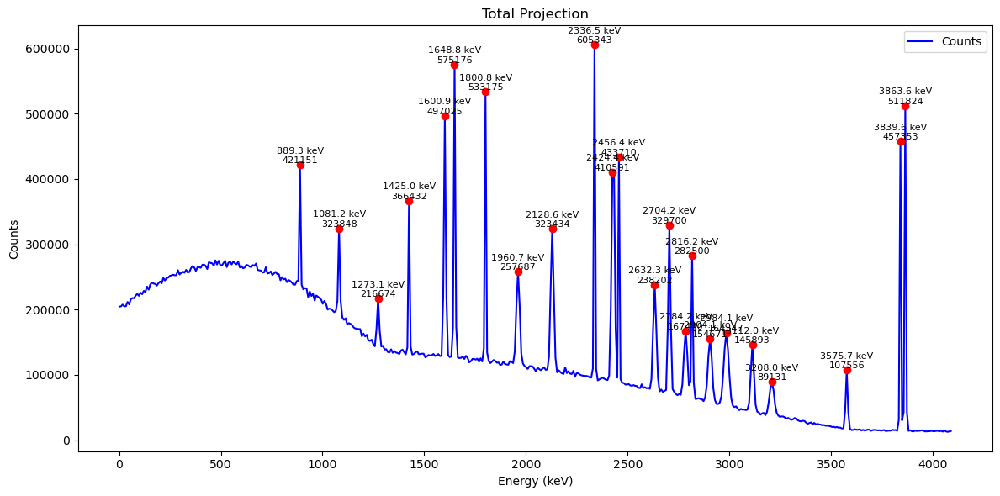

<Figure size 640x480 with 0 Axes>

In [48]:
# viewing simulation results




In [ ]:
TotalProjection(background, bin_factor=1)


In [ ]:

background_filtered2 += 0

TotalProjection(background_filtered2, bin_factor=1)


In [ ]:
from scipy.ndimage import correlate1d
correlate1d([2, 8, 0, 4, 1, 9, 9, 0], weights=[1, 3])


In [ ]:
from scipy.ndimage import convolve1d

input_array = [2, 8, 0, 4, 1]
kernel = [1, 3]

result = convolve1d(input_array, kernel)
print(result)

In [ ]:
np.uint32(10*(np.random.normal(1, .2, 4096)))

In [ ]:
def snake_ladder(positions, heights, widths, rungs, threshold=0.2, size=4096):
        positions_lst = []
        heights_lst = []
        widths_lst = []
        i = 1
        while True: # one band feature, keeps running until failure
            chance = random.uniform(0, 1) 
            if chance < threshold:
                #index = random.randint(0, len(positions)-1) random index
                index = len(positions)-1 #last index (last was ground, now first is)
                x0 = positions[index] 
                y0 = heights[index]
                d0 = (np.random.randint(30, 600)) * ((-1)**i) # term is negative for odd i, positive for even i
                # needs to be put back as variables
                result = generate_ladder(Energy_bin, random_width(x0, bin_factor), 0, 0.02, rungs, x0, y0, d0, size)
                if result is not None:
                    positions, heights, widths = result

                    positions_lst.extend(positions[1:])
                    heights_lst.extend(heights[1:])
                    widths_lst.extend(widths[1:])
                    i += 1
                    if i == 3:
                    # can only snake back twice
                        break
                else:
                    #print(f"Failed after {i} attempts")
                    break
        return positions_lst, heights_lst, widths_lst
